# Прогнозирование акций Теслы

# Загрузка данных

+ https://www.datasource.ai/uploads/1c79c40efac8fff409e7c23fe8167d04.html

+ [finance.yahoo.com](https://finance.yahoo.com/quote/TSLA/chart?p=TSLA#eyJpbnRlcnZhbCI6ImRheSIsInBlcmlvZGljaXR5IjoxLCJ0aW1lVW5pdCI6bnVsbCwiY2FuZGxlV2lkdGgiOjEsImZsaXBwZWQiOmZhbHNlLCJ2b2x1bWVVbmRlcmxheSI6dHJ1ZSwiYWRqIjp0cnVlLCJjcm9zc2hhaXIiOnRydWUsImNoYXJ0VHlwZSI6ImxpbmUiLCJleHRlbmRlZCI6ZmFsc2UsIm1hcmtldFNlc3Npb25zIjp7fSwiYWdncmVnYXRpb25UeXBlIjoib2hsYyIsImNoYXJ0U2NhbGUiOiJsaW5lYXIiLCJwYW5lbHMiOnsiY2hhcnQiOnsicGVyY2VudCI6MSwiZGlzcGxheSI6IlRTTEEiLCJjaGFydE5hbWUiOiJjaGFydCIsImluZGV4IjowLCJ5QXhpcyI6eyJuYW1lIjoiY2hhcnQiLCJwb3NpdGlvbiI6bnVsbH0sInlheGlzTEhTIjpbXSwieWF4aXNSSFMiOlsiY2hhcnQiLCLigIx2b2wgdW5kcuKAjCJdfX0sInNldFNwYW4iOm51bGwsImxpbmVXaWR0aCI6Miwic3RyaXBlZEJhY2tncm91bmQiOnRydWUsImV2ZW50cyI6dHJ1ZSwiY29sb3IiOiIjMDA4MWYyIiwic3RyaXBlZEJhY2tncm91ZCI6dHJ1ZSwicmFuZ2UiOm51bGwsImV2ZW50TWFwIjp7ImNvcnBvcmF0ZSI6eyJkaXZzIjp0cnVlLCJzcGxpdHMiOnRydWV9LCJzaWdEZXYiOnt9fSwic3ltYm9scyI6W3sic3ltYm9sIjoiVFNMQSIsInN5bWJvbE9iamVjdCI6eyJzeW1ib2wiOiJUU0xBIiwicXVvdGVUeXBlIjoiRVFVSVRZIiwiZXhjaGFuZ2VUaW1lWm9uZSI6IkFtZXJpY2EvTmV3X1lvcmsifSwicGVyaW9kaWNpdHkiOjEsImludGVydmFsIjoiZGF5IiwidGltZVVuaXQiOm51bGwsInNldFNwYW4iOm51bGx9XSwic3R1ZGllcyI6eyLigIx2b2wgdW5kcuKAjCI6eyJ0eXBlIjoidm9sIHVuZHIiLCJpbnB1dHMiOnsiaWQiOiLigIx2b2wgdW5kcuKAjCIsImRpc3BsYXkiOiLigIx2b2wgdW5kcuKAjCJ9LCJvdXRwdXRzIjp7IlVwIFZvbHVtZSI6IiMwMGIwNjEiLCJEb3duIFZvbHVtZSI6IiNmZjMzM2EifSwicGFuZWwiOiJjaGFydCIsInBhcmFtZXRlcnMiOnsid2lkdGhGYWN0b3IiOjAuNDUsImNoYXJ0TmFtZSI6ImNoYXJ0IiwicGFuZWxOYW1lIjoiY2hhcnQifX19fQ--)

In [19]:
# !pip install pandas-datareader
# !pip install tensorflow

In [ ]:
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas_datareader import data as pdr
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns

# import tensorflow as tf
# from keras.models import Sequential
# from keras.layers import Dense, LSTM, Input, Dropout, Flatten, GRU
# from keras.utils import set_random_seed
# from keras.optimizers import Adam
# from keras.callbacks import EarlyStopping, LearningRateScheduler

# from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

# from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error
# from sklearn.preprocessing import MinMaxScaler, StandardScaler
# from sklearn.model_selection import train_test_split
# from sklearn.feature_selection import mutual_info_regression

In [ ]:
pd.set_option("display.max_columns", 100)

In [ ]:
# end = pd.Timestamp.now() 
end = '2022-11-29'
# start = end - pd.DateOffset(years=5)
start = '2014-11-29'
# start = '2019-11-29'
print(f'{end},\n{start}')

In [ ]:
df = pdr.DataReader("TSLA",
                    data_source='yahoo',
                    start=start,
                    end=end,
                    )

df.drop('Close', axis=1, inplace=True)
df.rename(columns={'Adj Close': 'Close'}, inplace=True)
df.info()

Свечной график:
+ https://medium.com/codex/creating-candlestick-charts-using-python-plotly-8081c4820351

In [4]:
# Свечной график
candlestick = go.Candlestick(x=df.index,
                             open=df['Open'],
                             high=df['High'],
                             low=df['Low'],
                             close=df['Close'],
                             showlegend=False,
                             )

# график объема
volume = go.Bar(x=df.index,
                y=df.Volume,
                showlegend=False,
                marker_color='rgb(55, 83, 109)',
                )

# создание общего графика
fig = make_subplots(rows=2,
                    cols=1,
                    shared_xaxes=True,
                    vertical_spacing=0.1,
                    subplot_titles=('OHLC', 'Volume'),
                    row_width=[0.3, 0.7]
                    )


fig.add_trace(candlestick, row=1, col=1)
fig.add_trace(volume, row=2, col=1)

fig.update_layout(title="Tesla stock dynamics", height=600)
fig.update_xaxes(title_text="Date", row=2, col=1)
fig.update_yaxes(title_text="Price (USD)", row=1, col=1)
fig.update(layout_xaxis_rangeslider_visible=False)
fig.show()

# Feature Engineering
+ https://towardsdatascience.com/technical-analysis-library-to-financial-datasets-with-pandas-python-4b2b390d3543

## Индекс S&P 500

+ https://ru.wikipedia.org/wiki/S%26P_500

In [419]:
# индекс S&P 500 "^GSPC"
df_sp500 = pdr.DataReader("SPY",
                          data_source='yahoo',
                          start=start,
                          end=end,
                          )

df_sp500 = df_sp500[['Adj Close']].rename({'Adj Close': 'SP500'}, axis=1)
df = df.join(df_sp500)
df.head()

,High,Low,Open,Volume,Close,SP500
Date,,,,,,
2014-12-01,16.164667,15.267333,16.077333,129291000.0,15.442667,177.584747
2014-12-02,15.658667,15.200000,15.638000,88305000.0,15.428667,178.732681
2014-12-03,15.314667,15.033333,15.083333,79615500.0,15.286667,179.423126
2014-12-04,15.393333,15.187333,15.240000,57834000.0,15.218667,179.224625
2014-12-05,15.292667,14.817333,15.244667,90954000.0,14.914000,179.518021


https://pythonguides.com/matplotlib-two-y-axes/

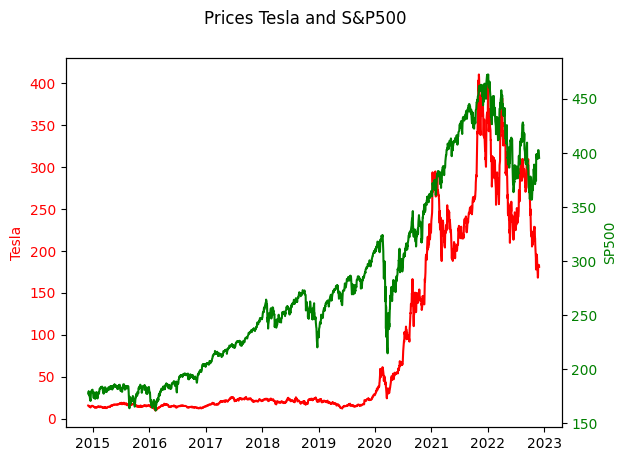

In [420]:
fig, ax1 = plt.subplots()
fig.suptitle('Prices Tesla and S&P500')

ax1.plot(df['Close'], color='red')
ax1.set_ylabel('Tesla', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()
ax2.plot(df['SP500'], color='green')
ax2.set_ylabel('SP500', color='green')
ax2.tick_params(axis='y', labelcolor='green')

## Децильность

In [392]:
# df['<100'] = (df['Close'] < 80).astype(int)

## VWAP
+ https://stackoverflow.com/questions/29298789/pandas-efficient-vwap-calculation
+ https://academy.binance.com/ru/articles/volume-weighted-average-price-vwap-explained

<AxesSubplot: >

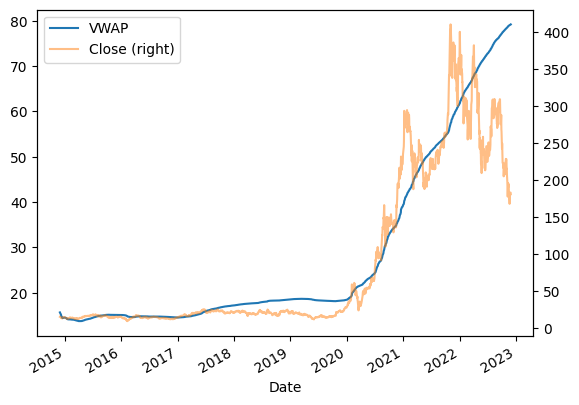

In [428]:
tp = df[['Low', 'High', 'Close']].mean(axis=1)
df['VWAP'] = (tp * df['Volume']).cumsum() / df['Volume'].cumsum()

fig, ax = plt.subplots()
df['VWAP'].plot(ax=ax, legend=True)
df['Close'].plot(ax=ax, secondary_y=True, alpha=0.5, legend=True)

## Разность

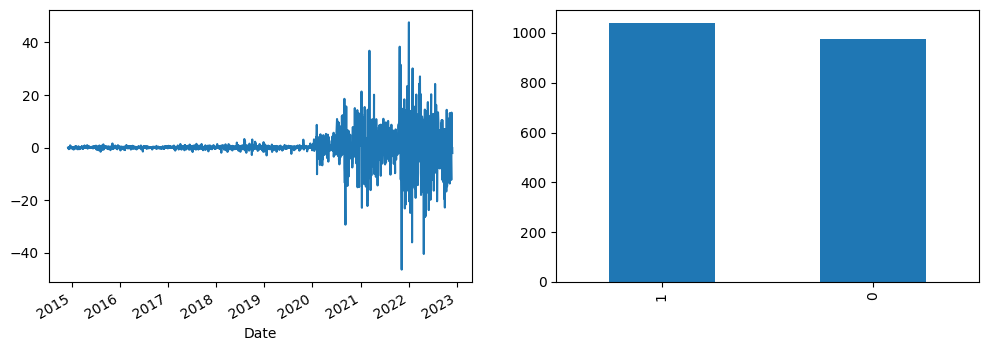

In [429]:
df['Diff_closes'] = df['Close'].diff()
df['rise'] = (df['Close'] > df['Close'].shift()).astype(int)

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
df['Diff_closes'].plot(ax=ax[0])
df['rise'].value_counts().plot(kind='bar', ax=ax[1]);

## ATR, ADX
+ https://medium.com/codex/algorithmic-trading-with-average-directional-index-in-python-2b5a20ecf06a
+ https://www.learnpythonwithrune.org/calculate-the-average-true-range-atr-easy-with-pandas-dataframes/

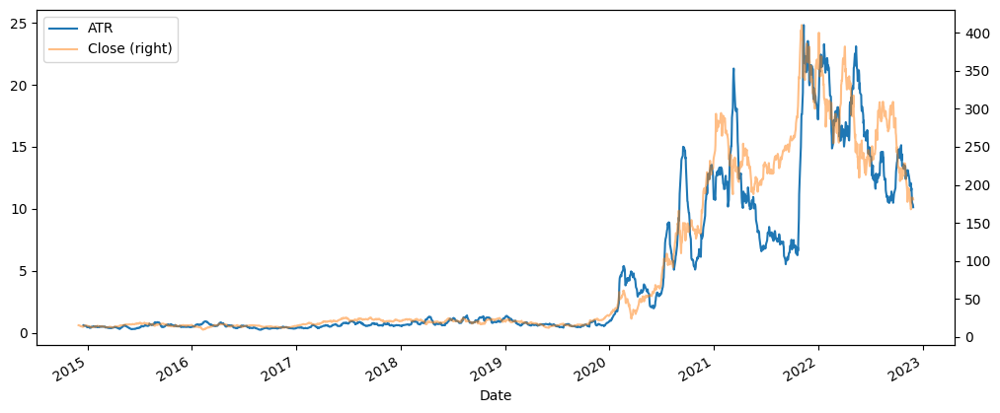

In [430]:
lookback = 14

high_low = df['High'] - df['Low']
high_close = np.abs(df['High'] - df['Close'].shift())
low_close = np.abs(df['Low'] - df['Close'].shift())
ranges = pd.concat([high_low, high_close, low_close], axis=1)
true_range = np.max(ranges, axis=1)
df['ATR'] = true_range.rolling(lookback).mean()

fig, ax = plt.subplots(figsize=(12, 5))
df['ATR'].plot(ax=ax, legend=True)
df['Close'].plot(ax=ax, secondary_y=True, alpha=0.5, legend=True);

<AxesSubplot: >

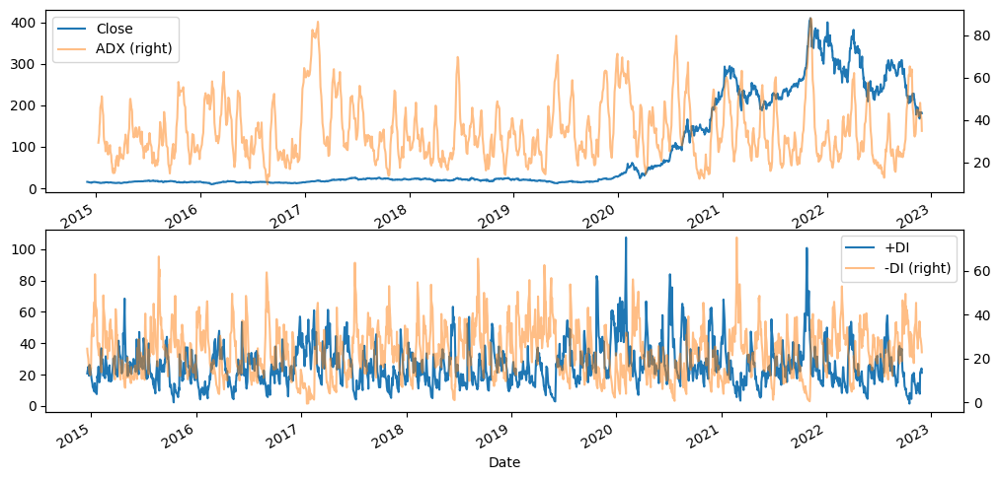

In [431]:
high_diff = df['High'].diff()
low_diff = -df['Low'].diff()

df['+DM'] = np.where(high_diff > low_diff, high_diff, 0)
df['-DM'] = np.where(low_diff > high_diff, low_diff, 0)

df['+DI'] = (df['+DM'].ewm(span=lookback, min_periods=lookback, adjust=False).mean() / df['ATR']) * 100
df['-DI'] = (df['-DM'].ewm(span=lookback, min_periods=lookback, adjust=False).mean() / df['ATR']) * 100

di = np.abs(df['+DI'] - df['-DI']) / np.abs(df['+DI'] + df['-DI']) * 100
adx = (di.shift() * (lookback-1) + di) / lookback
df['ADX'] = adx.ewm(span=lookback, min_periods=lookback, adjust=False).mean()

fig, ax = plt.subplots(2, 1, figsize=(12, 6))
df['Close'].plot(ax=ax[0], legend=True)
df['ADX'].plot(ax=ax[0], legend=True, secondary_y=True, alpha=0.5)
df['+DI'].plot(ax=ax[1], legend=True)
df['-DI'].plot(ax=ax[1], legend=True, secondary_y=True, alpha=0.5)

## Return, Volatility

Rate of Change = Simple Rate of Return.

+ https://dspyt.com/simple-returns-log-return-and-volatility-simple-introduction
+ https://www.wallstreetmojo.com/realized-volatility/

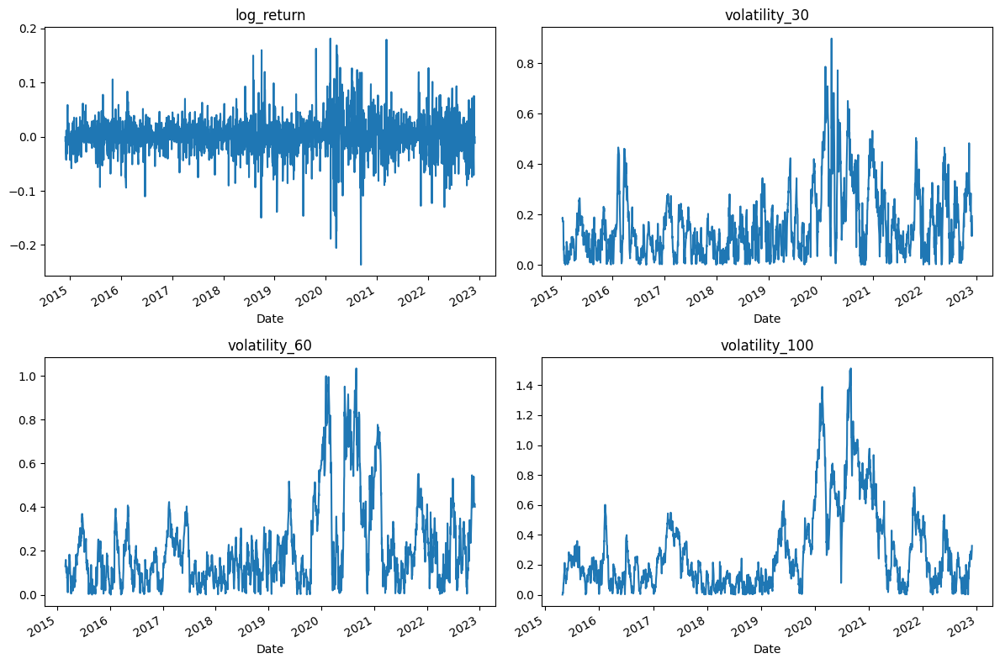

In [494]:
df['simple_return'] = df['Close'].pct_change()
df['log_return'] = np.log(df['Close']).diff()
df['volatility_30'] = np.sqrt(np.square(df['log_return'].rolling(30).sum()))
df['volatility_60'] = np.sqrt(np.square(df['log_return'].rolling(60).sum()))
df['volatility_100'] = np.sqrt(np.square(df['log_return'].rolling(100).sum()))

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
df['log_return'].plot(ax=axes[0, 0], title='log_return')
df['volatility_30'].plot(ax=axes[0, 1], title='volatility_30')
df['volatility_60'].plot(ax=axes[1, 0], title='volatility_60')
df['volatility_100'].plot(ax=axes[1, 1], title='volatility_100');
plt.tight_layout()

## Moving Average, Exponential Moving Average (MA, EMA)

<AxesSubplot: xlabel='Date'>

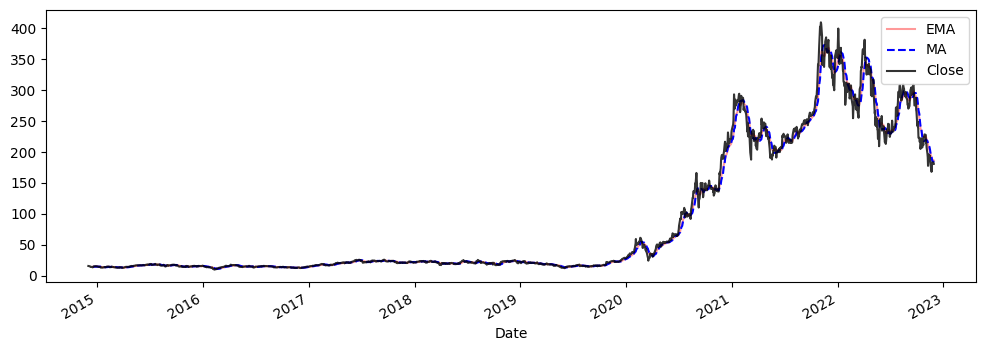

In [433]:
window = 14
df['MA'] = df['Close'].rolling(window).mean()
df['EMA'] = df['Close'].ewm(span=window, adjust=False, min_periods=window).mean()
# df['EMA'] = df['Close'].ewm(alpha=0.5).mean()

plt.figure(figsize=(12, 4))
df['EMA'].plot(style='-r', alpha=0.4, legend=True)
df['MA'].plot(style='--b', legend=True)
df['Close'].plot(c='black', alpha=0.8, legend=True)

## Moving Average Convergence Divergence (MACD)
+ https://www.learnpythonwithrune.org/pandas-calculate-the-moving-average-convergence-divergence-macd-for-a-stock/
+ https://www.alpharithms.com/calculate-macd-python-272222/

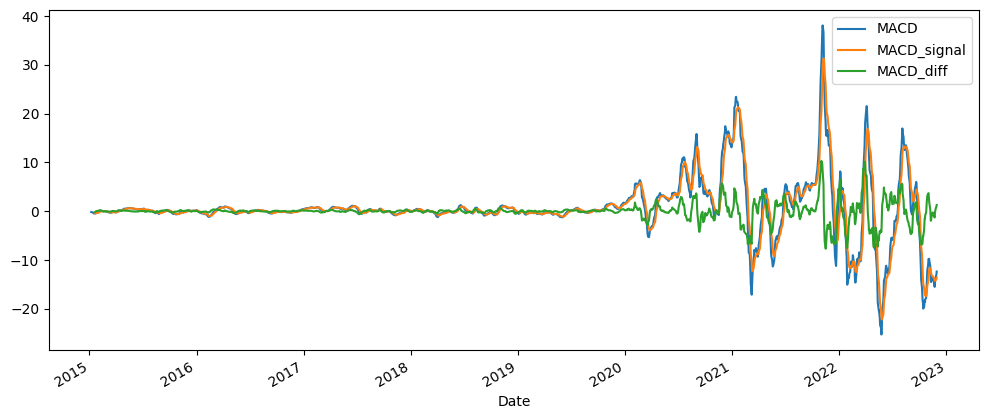

In [434]:
ewm_12 = df['Close'].ewm(span=12, adjust=False, min_periods=12).mean()
ewm_26 = df['Close'].ewm(span=26, adjust=False, min_periods=26).mean()
df['MACD'] = ewm_12 - ewm_26
df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False, min_periods=9).mean()
df['MACD_diff'] = df['MACD'] - df['MACD_signal']

plt.figure(figsize=(12, 5))
df['MACD'].plot(legend=True)
df['MACD_signal'].plot(legend=True)
df['MACD_diff'].plot(legend=True);

## RSI

+ https://medium.com/codex/algorithmic-trading-with-relative-strength-index-in-python-d969cf22dd85
+ https://www.learnpythonwithrune.org/pandas-calculate-the-relative-strength-index-rsi-on-a-stock/

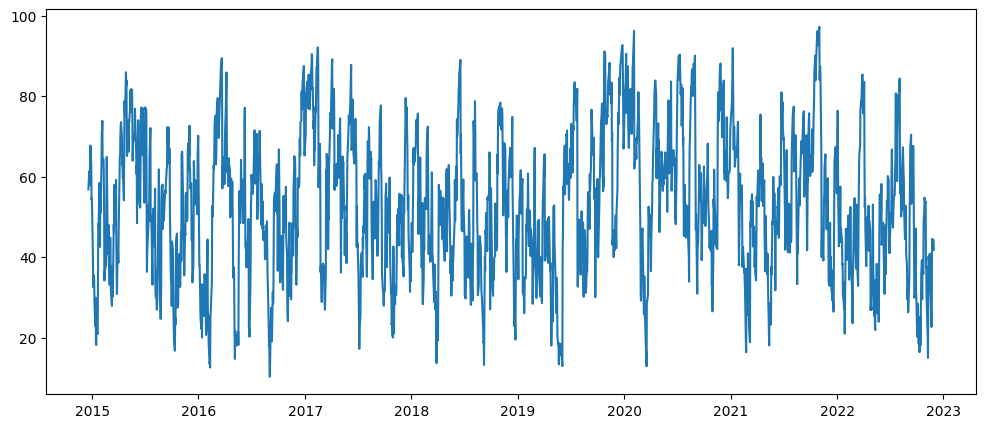

In [435]:
# com - дни в ретроспективе
def calculate_rsi(series, lookback):
    delta = series.diff()
    up = delta.clip(lower=0)
    down = delta.clip(upper=0).abs()
    ema_up = up.ewm(span=lookback, adjust=False, min_periods=lookback).mean()
    ema_down = down.ewm(span=lookback, adjust=False, min_periods=lookback).mean()
    rs = ema_up/ema_down
    rsi = 100 - (100/(1 + rs))
    return rsi


df['RSI'] = calculate_rsi(df['Close'], 14)

plt.figure(figsize=(12, 5))
plt.plot(df['RSI']);

## Bollinger Bands

+ https://en.wikipedia.org/wiki/Bollinger_Bands
+ https://medium.com/codex/algorithmic-trading-with-bollinger-bands-in-python-1b0a00c9ef99

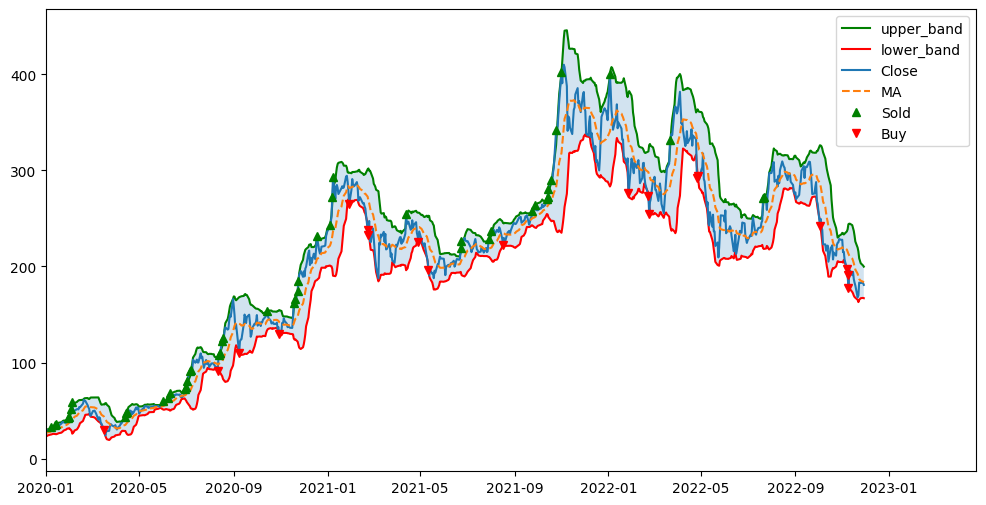

In [436]:
k = 2
std_20 = df['Close'].rolling(window).std()
std_ewm = df['Close'].ewm(span=window, adjust=False, min_periods=window).std()

df['upper_band'] = df['MA'] + k * std_20
df['lower_band'] = df['MA'] - k * std_20

plt.figure(figsize=(12, 6))
plt.plot(df['upper_band'], c='g', label='upper_band')
plt.plot(df['lower_band'], c='r', label='lower_band')
plt.plot(df['Close'], label='Close')
plt.plot(df['MA'], '--', label='MA')
plt.fill_between(df.index, df['upper_band'], df['lower_band'], alpha=0.2)

upper_point = df['Close'][df['Close'] > df['upper_band']]
lower_point = df['Close'][df['Close'] < df['lower_band']]
plt.plot(upper_point, 'g^', label='Sold')
plt.plot(lower_point, 'rv', label='Buy')
plt.xlim(pd.Timestamp('2020-01-01'))
plt.legend();

## Балансовый объём (OBV)
+ https://ru.wikipedia.org/wiki/%D0%91%D0%B0%D0%BB%D0%B0%D0%BD%D1%81%D0%BE%D0%B2%D1%8B%D0%B9_%D0%BE%D0%B1%D1%8A%D1%91%D0%BC

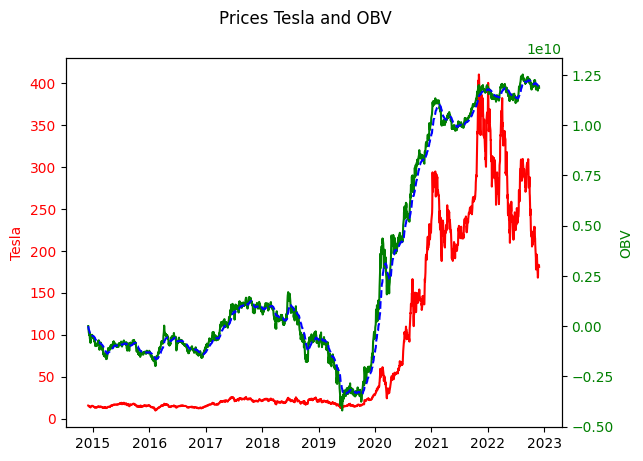

In [437]:
volumes = np.select(condlist=[df.Close.diff() > 0, df.Close.diff() < 0],
                    choicelist=[df.Volume, -df.Volume])

df['OBV'] = volumes.cumsum()

fig, ax1 = plt.subplots()
fig.suptitle('Prices Tesla and OBV')

ax1.plot(df['Close'], color='red')
ax1.set_ylabel('Tesla', color='red')
ax1.tick_params(axis='y', labelcolor='red')

ax2 = ax1.twinx()
ax2.plot(df['OBV'], color='green')
ax2.plot(df['OBV'].ewm(com=13).mean(), '--b')
ax2.set_ylabel('OBV', color='green')
ax2.tick_params(axis='y', labelcolor='green')

## Chaikin Money Flow (CMF)
+ https://corporatefinanceinstitute.com/resources/equities/chaikin-money-flow-cmf/
+ https://stackoverflow.com/questions/64124629/how-to-calculate-heiken-chaiken-osc-using-pandas-python
+ https://medium.com/swlh/creating-a-trading-strategy-from-scratch-in-python-fe047cb8f12

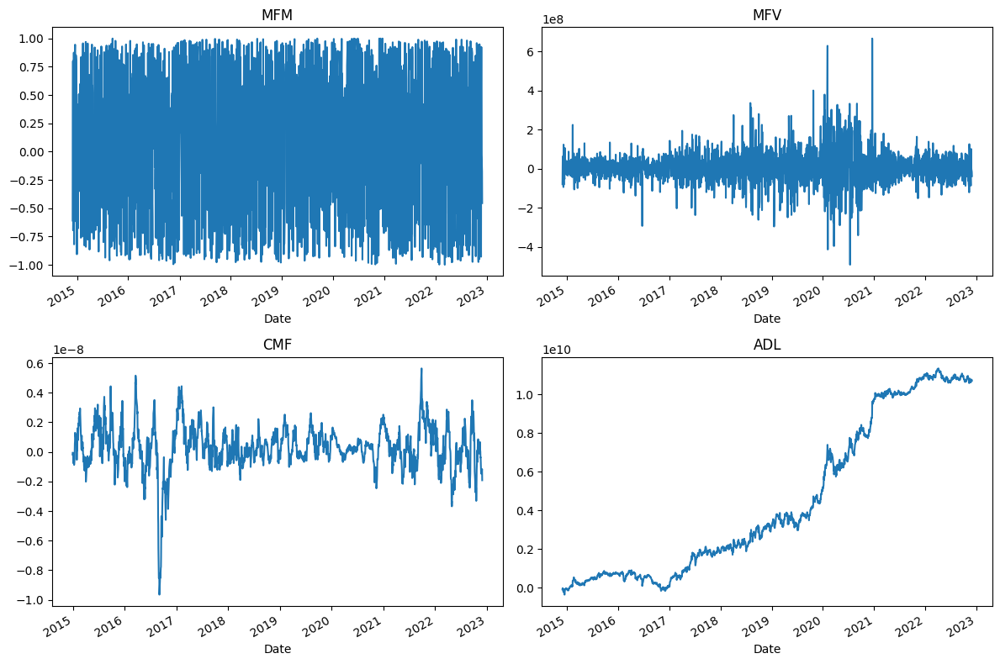

In [438]:
df['MFM'] = ((df['Close'] - df['Low']) - (df['High'] - df['Close'])) / (df['High'] - df['Low'])
df['MFV'] = df['MFM'] * df['Volume']
df['CMF'] = df['MFM'].rolling(21).mean() / df['Volume'].rolling(21).mean()
df['ADL'] =  df['MFV'].cumsum()

fig, ax = plt.subplots(2, 2, figsize=(12, 8))
df['MFM'].plot(ax=ax[0, 0], title='MFM')
df['MFV'].plot(ax=ax[0, 1], title='MFV')
df['CMF'].plot(ax=ax[1, 0], title='CMF')
df['ADL'].plot(ax=ax[1, 1], title='ADL')
plt.tight_layout()

In [439]:
df.describe()

,High,Low,Open,Volume,Close,SP500,year,quarter,VWAP,Diff_closes,rise,ATR,+DM,-DM,+DI,-DI,ADX,simple_return,log_return,volatility_30,volatility_60,volatility_100,MA,EMA,MACD,MACD_signal,MACD_diff,RSI,upper_band,lower_band,OBV,MFM,MFV,CMF,ADL
count,2014.000000,2014.000000,2014.000000,2.014000e+03,2014.000000,2014.000000,2014.000000,2014.000000,2014.000000,2013.000000,2014.000000,2001.000000,2014.000000,2014.000000,2001.000000,2001.000000,1987.000000,2013.000000,2013.000000,1984.000000,1954.000000,1914.000000,2001.000000,2001.000000,1989.000000,1981.000000,1981.000000,2000.000000,2001.000000,2001.000000,2.014000e+03,2014.000000,2.014000e+03,1.994000e+03,2.014000e+03
mean,89.143745,85.036166,87.186896,1.108205e+08,87.129728,279.694186,2018.412612,2.513903,28.185482,0.082160,0.516385,4.471364,1.104996,1.076238,25.796939,22.835442,34.802419,0.001848,0.001222,0.155689,0.213724,0.283250,87.059133,87.044139,0.674996,0.705791,-0.026885,53.130093,96.541342,77.576925,2.868637e+09,0.033534,5.321973e+06,2.930770e-10,4.482267e+09
std,111.220535,105.880646,108.714414,8.017944e+07,108.565797,87.705582,2.308984,1.114666,19.605667,5.455207,0.499856,6.109417,3.406510,3.399203,12.984620,11.305880,14.147831,0.035410,0.035360,0.134467,0.194302,0.280346,108.394663,108.214565,6.163465,5.772147,1.877674,17.513776,120.747047,96.556896,5.274378e+09,0.615400,8.519086e+07,1.501130e-09,4.003492e+09
min,10.331333,9.403333,9.488000,1.062000e+07,9.578000,161.966278,2014.000000,1.000000,13.696286,-46.480011,0.000000,0.256238,-8.020020,-6.333344,1.449591,-0.513674,9.763366,-0.210628,-0.236518,0.000142,0.000115,0.000172,10.785619,11.070764,-25.271333,-22.213158,-7.678481,10.304821,12.396554,8.681395,-4.199914e+09,-0.999676,-4.910729e+08,-9.654679e-09,-3.526304e+08
25%,16.255666,15.706833,15.985166,6.293512e+07,16.012832,198.429474,2016.000000,2.000000,14.989717,-0.414000,0.000000,0.573762,0.000000,0.000000,16.909614,14.492528,24.214232,-0.014929,-0.015041,0.056447,0.077654,0.083912,16.001524,15.971433,-0.365129,-0.328286,-0.171870,40.391993,17.191100,14.728555,-9.980194e+08,-0.515983,-4.071563e+07,-4.325151e-10,7.365987e+08
50%,21.835334,21.108000,21.531000,8.707555e+07,21.571000,259.875809,2018.000000,3.000000,18.201963,0.023333,1.000000,0.815048,0.000000,0.000000,23.532362,21.841368,31.436578,0.001210,0.001209,0.120525,0.158282,0.187618,21.733953,21.780621,0.097053,0.103994,0.011674,52.934607,23.690054,19.854333,3.466552e+08,0.030473,1.918142e+06,2.656790e-10,3.129116e+09
75%,184.797501,174.674995,178.932507,1.263690e+08,179.540001,353.163307,2020.000000,4.000000,35.826342,0.503334,1.000000,7.346189,0.409500,0.333329,31.989149,30.374004,42.829565,0.018706,0.018533,0.217016,0.278070,0.397749,173.458810,177.549716,1.049551,0.986213,0.186727,65.327802,206.893371,135.997459,9.027574e+09,0.605789,5.018706e+07,1.095247e-09,8.281906e+09
max,414.496674,405.666656,411.470001,9.140820e+08,409.970001,472.242310,2022.000000,4.000000,79.224364,47.666656,1.000000,24.814054,45.006653,40.493317,107.397798,75.129670,88.084638,0.198949,0.181445,0.898425,1.034347,1.512873,373.069046,368.666572,38.067930,31.285426,10.296174,97.253740,445.803398,337.513162,1.252184e+10,1.000000,6.663786e+08,5.648008e-09,1.135228e+10


## Время

In [421]:
df['month'] = df.index.month_name()
df['day'] = df.index.day_name()
df['year'] = df.index.year
df['quarter'] = df.index.quarter

<AxesSubplot: xlabel='year', ylabel='Close'>

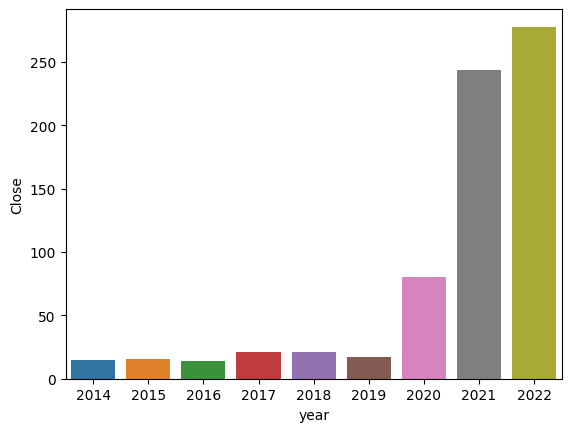

In [492]:
df_year = df.groupby(['year'], as_index=False)[['Close']].median()
sns.barplot(data=df_year, x='year', y='Close')

<AxesSubplot: xlabel='month', ylabel='Close'>

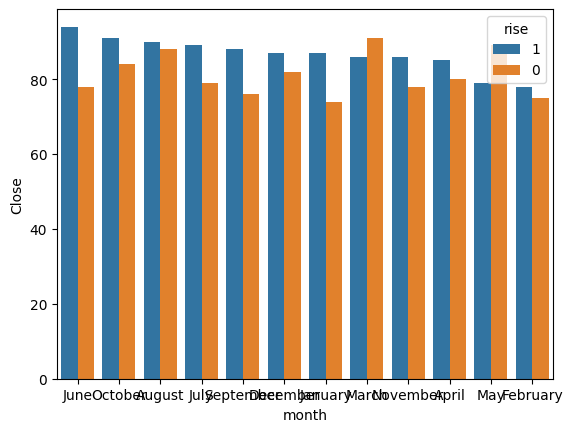

In [487]:
df_month = df.groupby(['month', 'rise'], as_index=False)[['Close']].count()
df_sort = df_month.sort_values(['rise', 'Close'], ascending=False)
df_sort = df_sort[df_sort['rise'] == 1]
sns.barplot(data=df_month, x="month", y="Close", hue="rise", order=df_sort['month'].tolist(), hue_order=[1, 0])

<AxesSubplot: xlabel='day', ylabel='Close'>

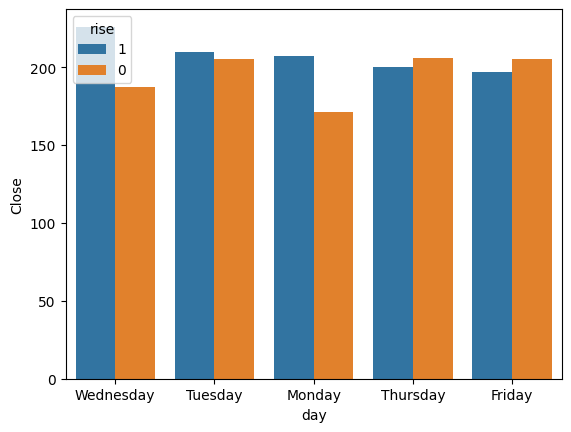

In [486]:
df_day = df.groupby(['day', 'rise'], as_index=False)[['Close']].count()
df_sort = df_day.sort_values(['rise', 'Close'], ascending=False)
df_sort = df_sort[df_sort['rise'] == 1]
sns.barplot(data=df_day, x="day", y="Close", hue="rise", order=df_sort['day'].tolist(), hue_order=[1, 0])

<AxesSubplot: xlabel='quarter', ylabel='Close'>

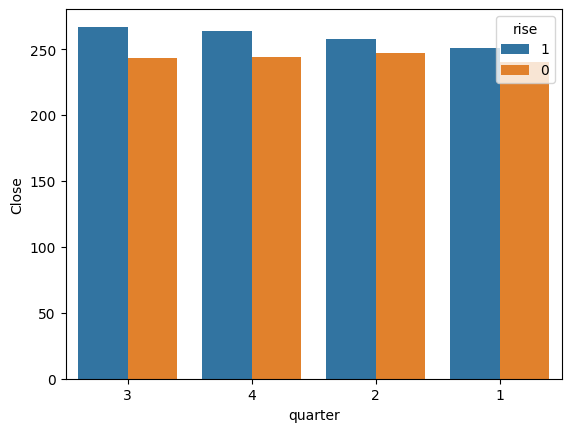

In [473]:
df_quarter = df.groupby(['quarter', 'rise'], as_index=False)[['Close']].count().sort_values(['rise', 'Close'])
sns.barplot(data=df_quarter, x="quarter", y="Close", hue="rise", order=[3, 4, 2, 1], hue_order=[1, 0])

<AxesSubplot: xlabel='month', ylabel='log_return'>

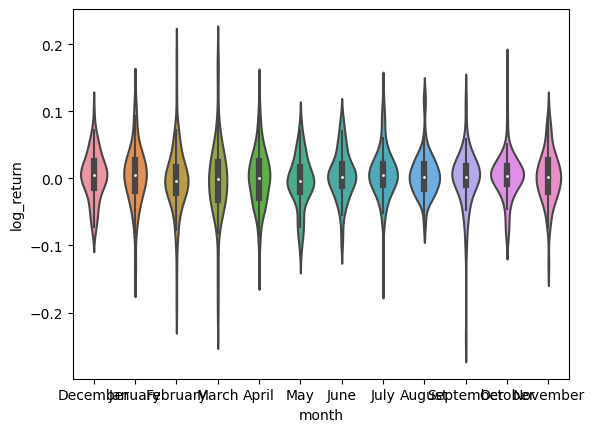

In [518]:
sns.violinplot(data=df.iloc[-1000:], x="month", y="log_return")

<AxesSubplot: xlabel='day', ylabel='log_return'>

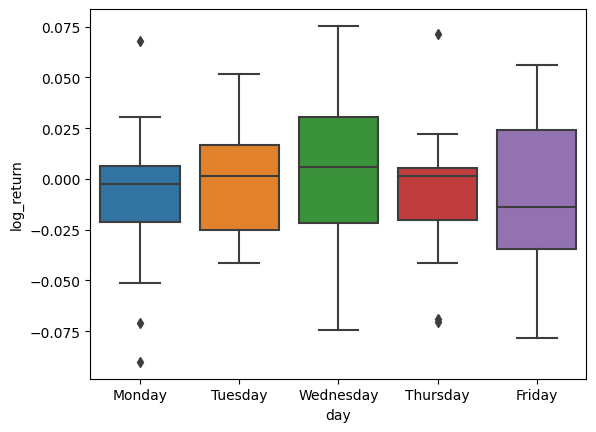

In [521]:
sns.boxplot(data=df.iloc[-90:], x="day", y="log_return")

## Корреляция

<AxesSubplot: >

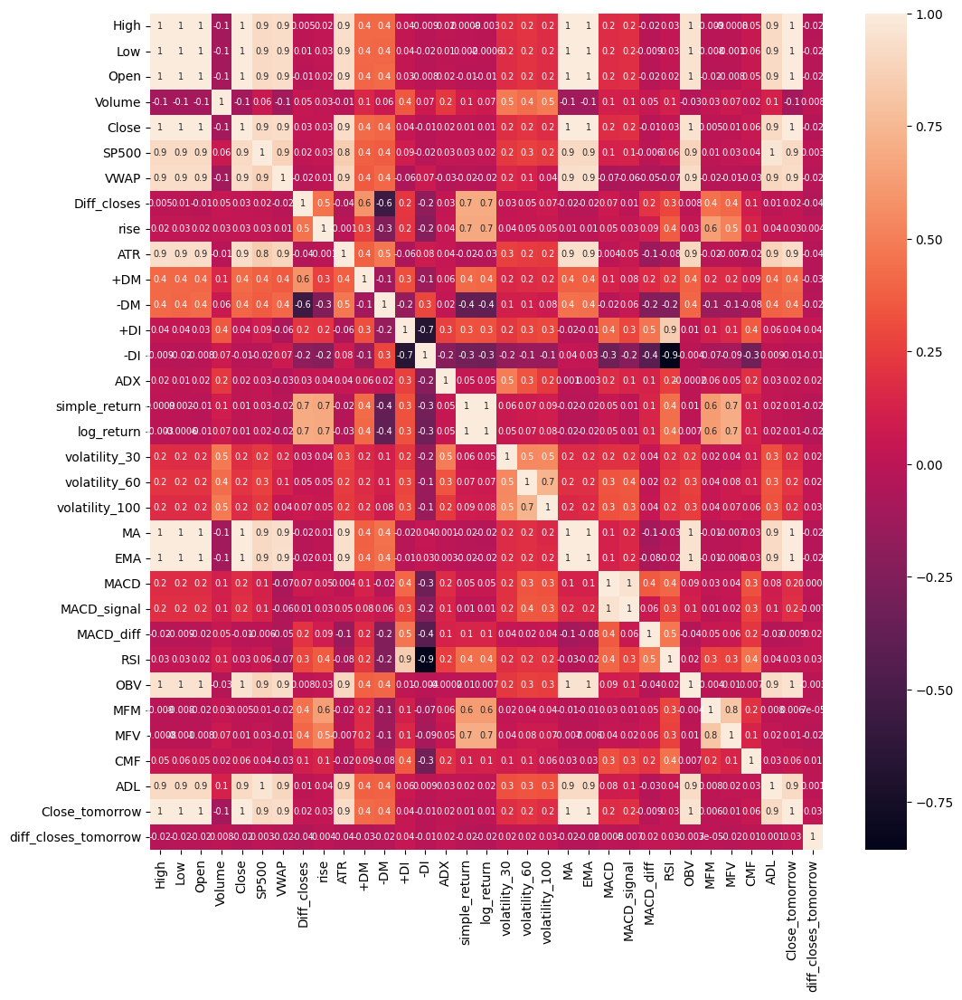

In [362]:
df['Close_tomorrow'] = df['Close'].shift(-1)
df['diff_closes_tomorrow'] = df['Diff_closes'].shift(-1)
plt.figure(figsize=(12, 12))
sns.heatmap(df.corr().dropna(), annot=True, annot_kws={'fontsize': 7}, fmt='.1g')

## Автокорреляция

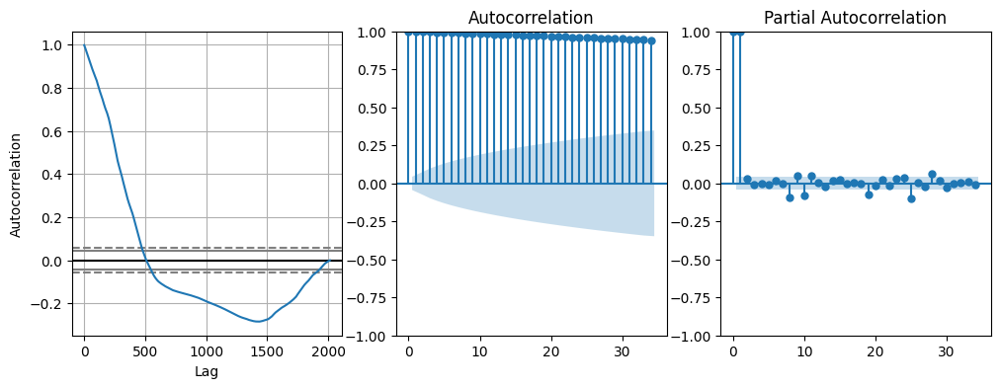

In [363]:
df_acorr = df['Close'].dropna()

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
pd.plotting.autocorrelation_plot(df_acorr, ax=axes[0])
plot_acf(df_acorr, ax=axes[1])
plot_pacf(df_acorr, method='ywm', ax=axes[2]);

## Фурье

https://towardsdatascience.com/fourier-transform-for-time-series-292eb887b101

Text(0.5, 0, 'Frequency (log scale)')

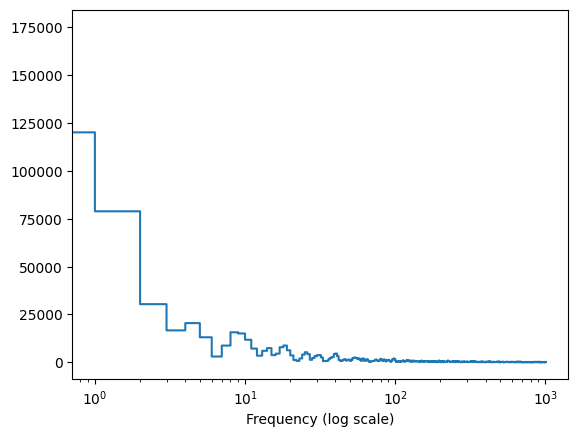

In [364]:
fft = tf.signal.rfft(df['Close'].dropna())
f_per_dataset = np.arange(0, len(fft))
# plt.plot(np.abs(fft))

plt.step(f_per_dataset, np.abs(fft))
plt.xscale('log')
plt.xlabel('Frequency (log scale)')

## Отбор признаков

<BarContainer object of 33 artists>

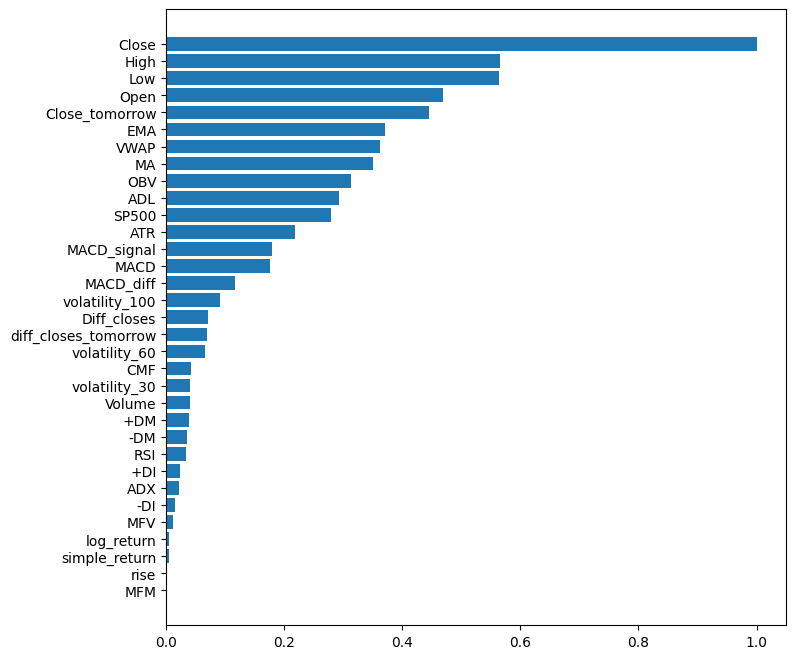

In [365]:
target = 'Close'

df_mi = df.copy()
columns_mi = df_mi.columns
df_mi['target'] = df_mi[target].shift(-1)
df_mi = df_mi.dropna()
mi = mutual_info_regression(df_mi[columns_mi], df_mi[target])
mi /= mi.max()

indexes = mi.argsort()

plt.figure(figsize=(8, 8))
plt.barh(columns_mi[indexes], mi[indexes])

In [368]:
selected = indexes[mi[indexes] > .15]
columns_mi[selected]

Index(['MACD', 'MACD_signal', 'ATR', 'SP500', 'ADL', 'OBV', 'MA', 'VWAP',
       'EMA', 'Close_tomorrow', 'Open', 'Low', 'High', 'Close'],
      dtype='object')

## Распределения данных

C:\Users\Rodion\AppData\Local\Temp\ipykernel_7484\3967099176.py:7: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



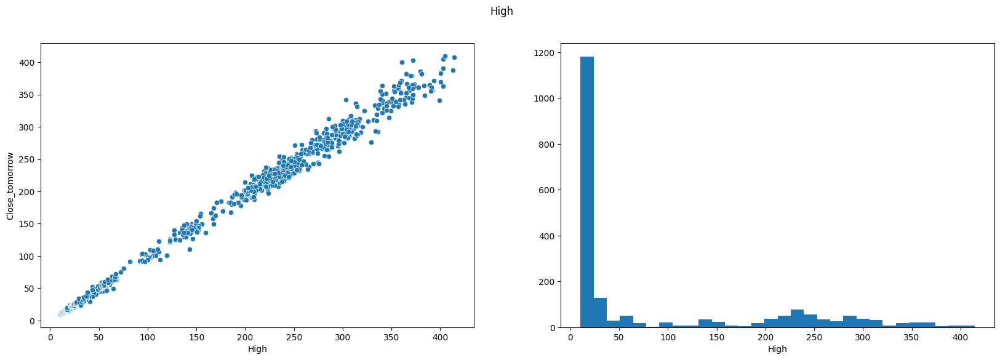

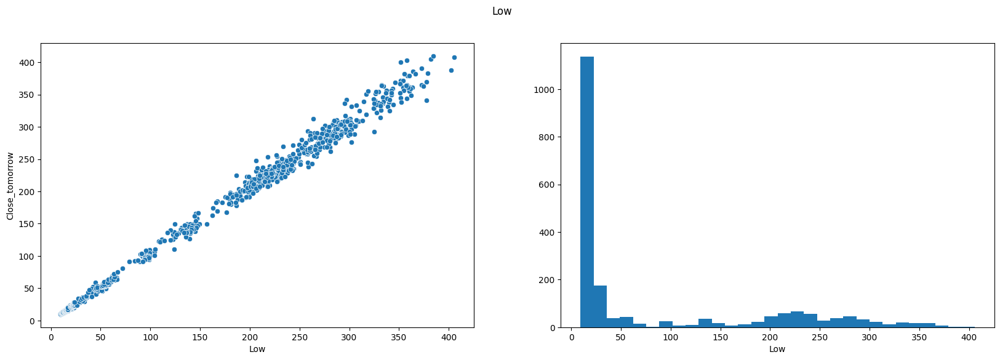

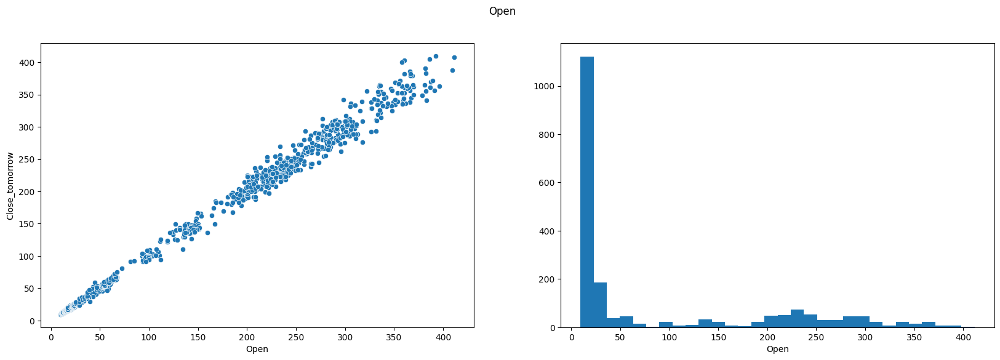

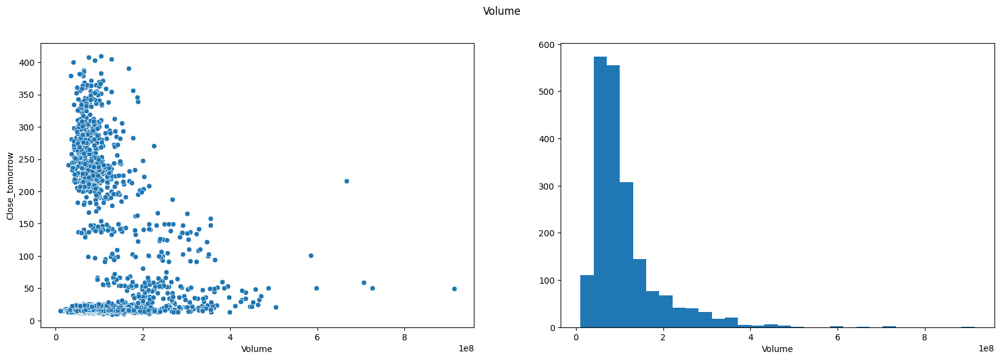

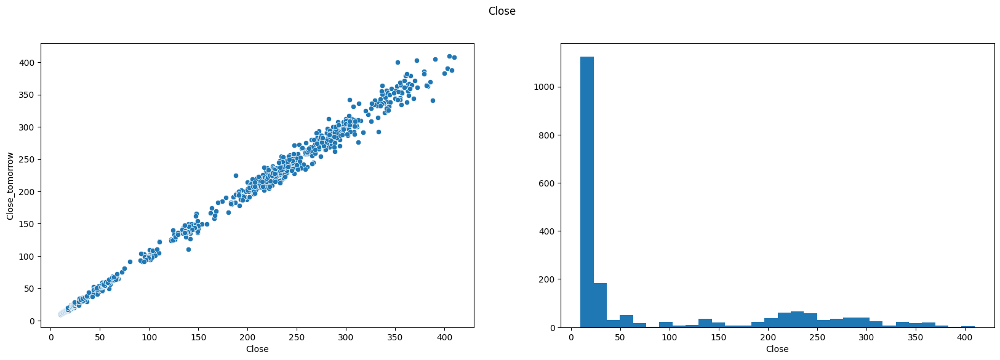

...

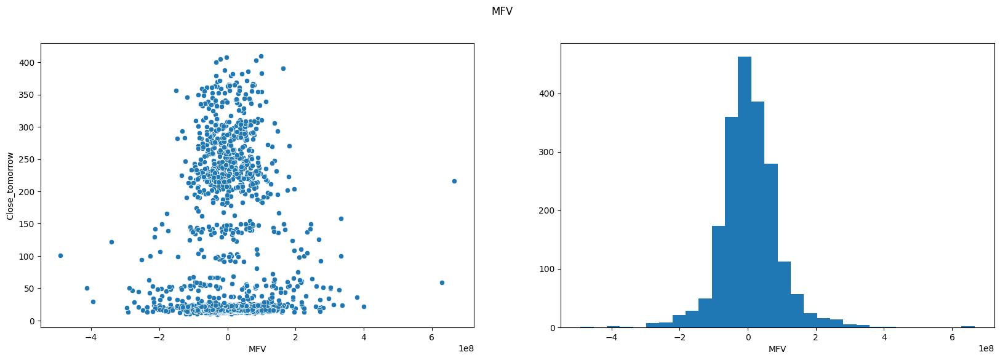

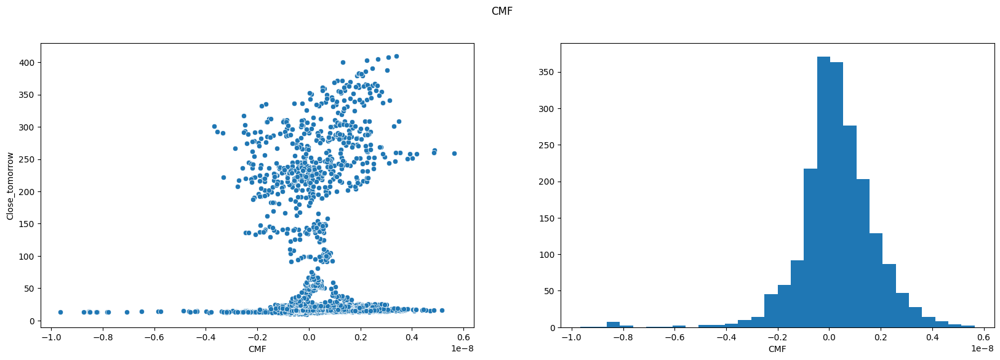

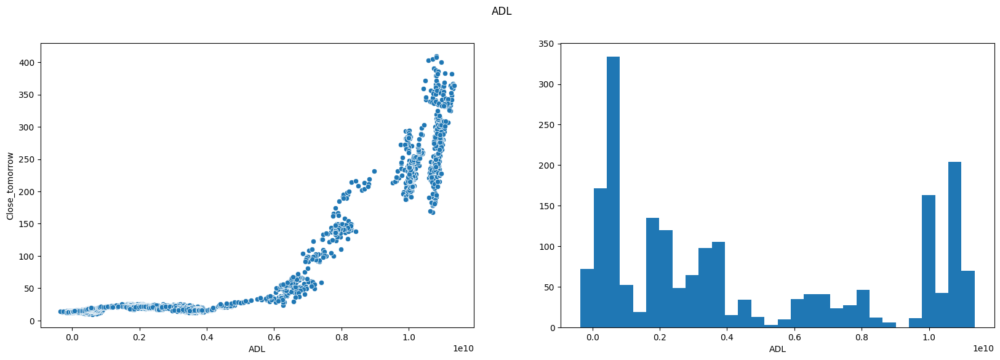

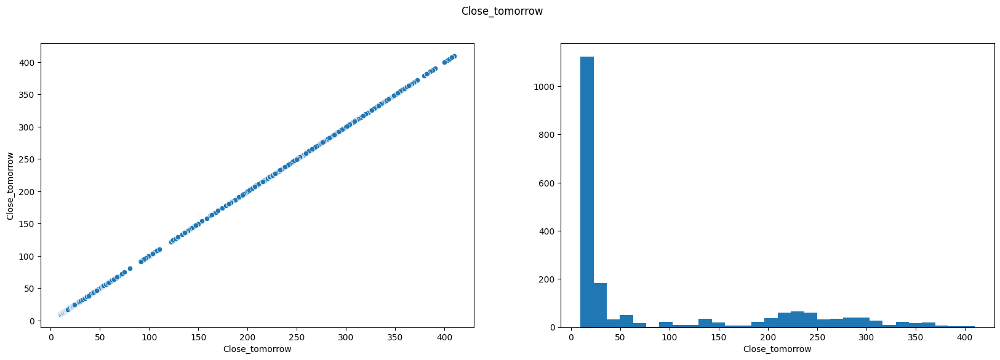

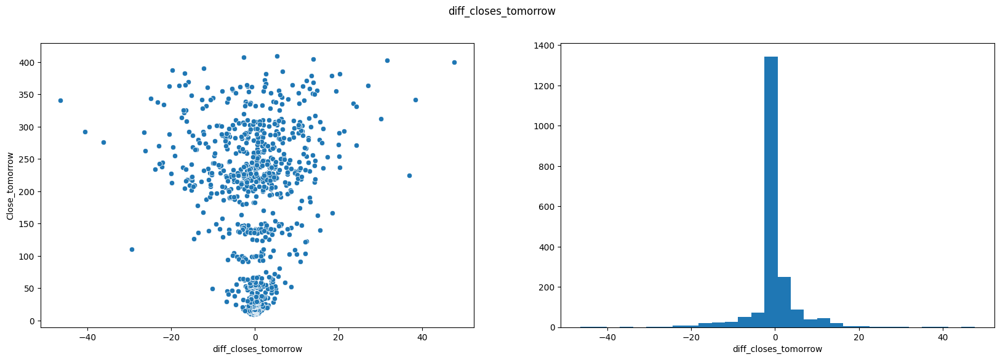

In [396]:
columns = df.columns[:-2]
target_column = 'Close_tomorrow'
hue = None
target = df[target_column]
for feature in columns:
    df_feature = df[feature]
    fig, ax = plt.subplots(1, 2, figsize=(20, 6))
    fig.suptitle(feature)
    sns.scatterplot(data=df, x=feature, y=target_column, ax=ax[0])
    ax[0].set_xlabel(feature)
    ax[0].set_ylabel(target_column)
    ax[1].hist(df[feature], bins=30);
    ax[1].set_xlabel(feature)

## Логарифмирование таргета

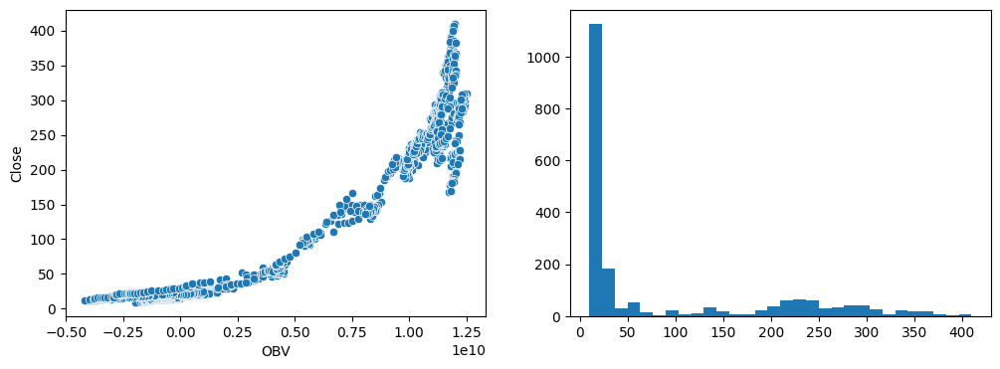

In [395]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sns.scatterplot(data=df, x='OBV', y='Close', ax=ax[0])
ax[1].hist(df['Close'], bins=30);

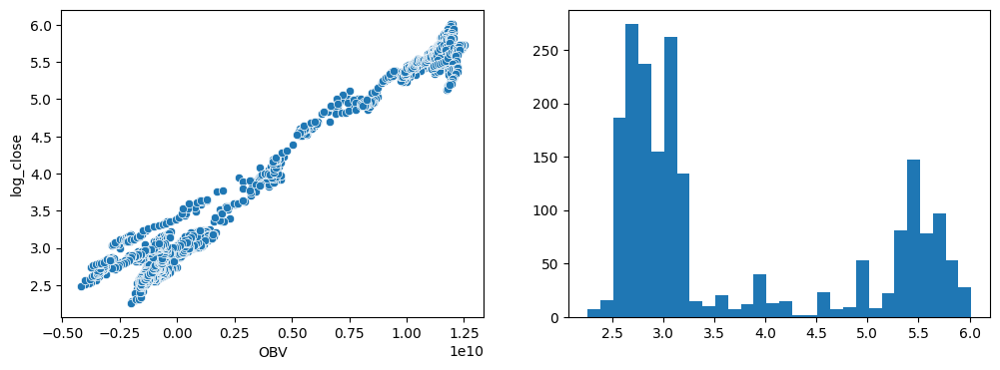

In [397]:
df['log_close'] =  np.log(df['Close'])

fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sns.scatterplot(data=df, x='OBV', y='log_close', ax=ax[0])
ax[1].hist(df['log_close'], bins=30);

# Моделирование
+ https://medium.com/analytics-vidhya/analysis-of-stock-price-predictions-using-lstm-models-f993faa524c4
+ https://github.com/miracl1e6/Tesla-Stock-Price/blob/master/tesla-stock-price-prediction-lstm-vs-gru-2.ipynb
+ https://www.tensorflow.org/tutorials/structured_data/time_series
+ https://habr.com/ru/post/701798/
+ https://habr.com/ru/post/527334/
+ https://www.datacamp.com/tutorial/lstm-python-stock-market
+ https://www.datacamp.com/tutorial/tutorial-for-recurrent-neural-network#!&_escaped_fragment_=

## Метрики

In [36]:
def calculate_metrics(y_real, y_predict):
    assert len(y_real) == len(
        y_predict), "y_real и y_predict имеют разное кол-во примеров"
    mse = mean_squared_error(y_real, y_predict)
    rmse = mean_squared_error(y_real, y_predict, squared=False)
    mae = mean_absolute_error(y_real, y_predict)
    mape = mean_absolute_percentage_error(y_real, y_predict)
    return mse, rmse, mae, mape


def print_metrics(metrics, metrics_names):
    print(*(f'{name}: {value}' for name,
          value in zip(metrics_names, metrics)), sep='\n')


def add_results(df_results, metrics, model_name):
    data = [[model_name] + list(metrics)]
    df_model = pd.DataFrame(data=data, columns=df_results.columns)
    df_results = pd.concat([df_results, df_model], axis=0).drop_duplicates(
        subset=df_results.columns[0], keep='last', ignore_index=True)
    return df_results


def plot_predicted_points(y_predict, y_real):
    plt.figure(figsize=(12, 5))
    plt.plot(y_predict, label='predict', alpha=.7)
    plt.plot(y_real, label='real', alpha=.7)
    plt.xlabel('День')
    plt.ylabel('Цена')
    plt.title('Предсказания цены акции')
    plt.legend()

In [37]:
# Подготовка метрик для сравнения результатов
metrics_names = ['MSE', 'RMSE', 'MAE', 'MAPE']
columns = ['model'] + metrics_names
df_results = pd.DataFrame(columns=columns)

## Подготовка данных. 1 день предсказания

In [39]:
def normalization_data(data):
    scaler = MinMaxScaler(feature_range=(0, 1))
    data_scaled = scaler.fit_transform(data)
    return data_scaled, scaler


def generate_window_data(X, y, history_points, future_points):
    assert len(X) == len(y), "X и y имеют разное кол-во примеров"
    
    n = len(X)
    X_data, y_data = [], []

    for i in range(history_points, n - future_points + 1):
        X_sample = X[i-history_points:i]
        y_sample = y[i:i+future_points]
        X_data.append(X_sample)
        y_data.append(y_sample)

    X_data = np.array(X_data)
    y_data = np.array(y_data).reshape(-1, future_points)

    return X_data, y_data

In [324]:
# параметры данных для обучения
features = ['log_close']
# features = ['Close']
target = ['log_close']

history_points = 21
future_points = 1
train_size = 0.8
n_features = len(features)

# данные для обучения
data = df.dropna()
X = data[features].values
y = data[target].values

# нормализация данных
X_scaled, x_scaler = normalization_data(X)
y_scaled, y_scaler = normalization_data(y)

# Разбиение данных на Train/test
X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(
    X_scaled, y_scaled, train_size=train_size, shuffle=False)

n_train = len(X_train_data)
n_test = len(X_test_data)

# формирование оконного формата данных
X_train, y_train = generate_window_data(
    X_train_data, y_train_data, history_points, future_points)
X_test, y_test = generate_window_data(
    X_test_data, y_test_data, history_points, future_points)

# индексы Train/test
train_index = data.index[history_points: n_train - future_points + 1]
test_index = data.index[n_train +
                        history_points: n_train + n_test - future_points + 1]

print('Train size :', n_train)
print(f'Train shape: X={X_train.shape} y={y_train.shape}')
print(f'Train date: {train_index.min()} -> {train_index.max()}')
print()
print('Test size:', n_test)
print(f'Test shape: X={X_test.shape} y={y_test.shape}')
print(f'Test date: {test_index.min()} -> {test_index.max()}')

Train size : 1530
Train shape: X=(1509, 21, 1) y=(1509, 1)
Train date: 2015-05-27 00:00:00 -> 2021-05-21 00:00:00

Test size: 383
Test shape: X=(362, 21, 1) y=(362, 1)
Test date: 2021-06-23 00:00:00 -> 2022-11-28 00:00:00


## Baseline. Завтра так же как сегодня

MSE: 0.001416139066079242
RMSE: 0.03763162321876698
MAE: 0.027759506076322216
MAPE: 0.004949168390364859


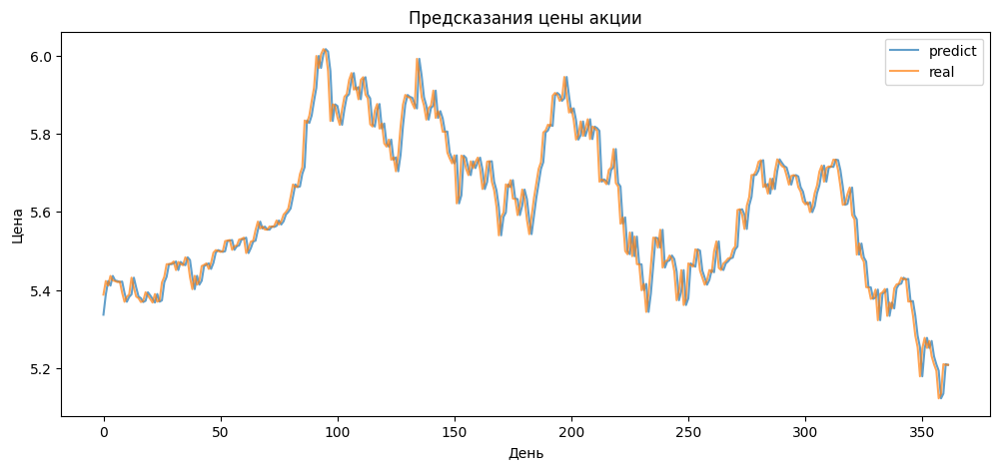

In [325]:
y_predict_baseline = data[target].shift(1).loc[test_index].values
y_real_baseline = data[target].loc[test_index].values

metrics = calculate_metrics(y_real_baseline, y_predict_baseline)
df_results = add_results(df_results, metrics, 'baseline')
print_metrics(metrics, metrics_names)
plot_predicted_points(y_predict_baseline, y_real_baseline)

## EMA. Завтра = среднее предыдущих дней

MSE: 0.0015272663966829094
RMSE: 0.03908025584208616
MAE: 0.029477256650458944
MAPE: 0.00525367120227438


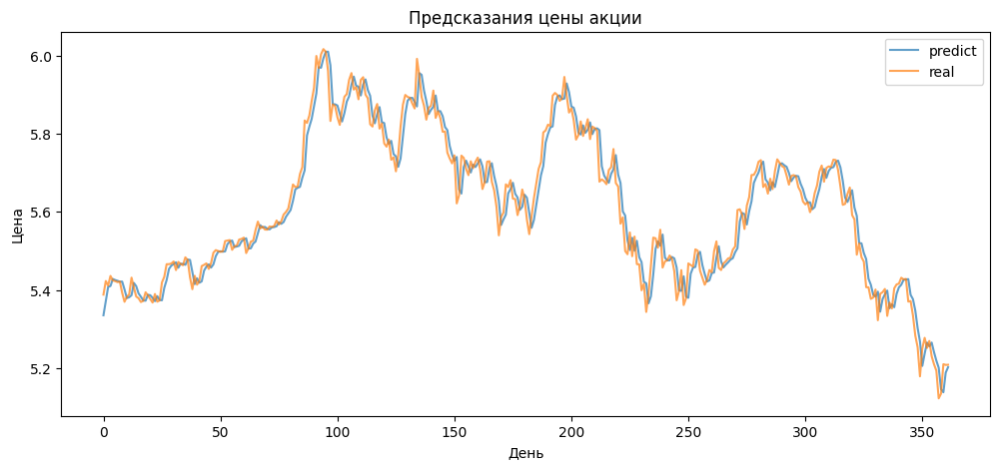

In [326]:
y_predict = data[target].ewm(alpha=0.7).mean().shift(1).loc[test_index].values
y_real = data[target].loc[test_index].values

metrics = calculate_metrics(y_real, y_predict)
df_results = add_results(df_results, metrics, 'EMA')
print_metrics(metrics, metrics_names)
plot_predicted_points(y_predict, y_real)

## Нейросеть

+ https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/
+ https://thinkingneuron.com/predicting-stock-prices-using-deep-learning-lstm-model-in-python/
+ https://towardsdatascience.com/learning-rate-schedule-in-practice-an-example-with-keras-and-tensorflow-2-0-2f48b2888a0c

### Grid search

+ https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

In [49]:
def inverse_predict_real(model, X_test, y_test, scaler):
    predict = model.predict(X_test, verbose=0)
    predict = scaler.inverse_transform(predict)
    real = scaler.inverse_transform(y_test)
    return predict, real


def plot_full_data(data, y, train_index, y_train_predict, test_index, y_test_predict):
    plt.figure(figsize=(12, 5))
    plt.plot(data.index, y)
    plt.plot(train_index, y_train_predict)
    plt.plot(test_index, y_test_predict)
    plt.legend(['real', 'train', 'test'])


def plot_result_model(history):
    fig, axes = plt.subplots(1, 2, figsize=(12, 3))
    axes[0].plot(history.history['loss'], label='train_loss')
    axes[0].plot(history.history['val_loss'], label='val_loss')
    axes[0].legend()
    axes[0].set_xlabel('Эпохи')
    axes[0].set_title('Loss')
    axes[0].set_ylim(0, max(history.history['val_loss']))
    axes[1].plot(history.history['val_mape'], label='val_mape')
    axes[1].legend()
    axes[1].set_xlabel('Эпохи')
    axes[1].set_title('MAPE')


def root_mean_squared_error(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_pred - y_true)))


def lr_time_based_decay(epoch, lr):
    return lr * 1 / (1 + decay * epoch)

Для воспроизводимрсти результатов модели в Jupyter - устанаваливать семя случайности `set_random_seed` в той ячейке, где требуется воспроизводимость

In [52]:
RANDOM_SEED = 20

# decay = learning_rate / epochs

# lr_sheduler = LearningRateScheduler(lr_time_based_decay)
# earlystop = EarlyStopping(monitor='val_loss', patience=50)

### Simple LSTM

In [98]:
def simple_lstm(history_points, n_features, future_points, n_lstm):
    model = Sequential([
        Input((history_points, n_features)),
        LSTM(n_lstm),
        Dense(future_points),
    ])
    return model

In [270]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 50
batch_size=32

model = simple_lstm(history_points, n_features, future_points, 100)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
                    )

Epoch 1/50
43/43 [==============================] - 6s 54ms/step - loss: 0.0015 - mape: 15870.3223 - val_loss: 0.0039 - val_mape: 9.2400
Epoch 2/50
43/43 [==============================] - 1s 34ms/step - loss: 1.7383e-04 - mape: 3003.6501 - val_loss: 0.0039 - val_mape: 9.0464
Epoch 3/50
43/43 [==============================] - 1s 33ms/step - loss: 1.4029e-04 - mape: 5097.4385 - val_loss: 0.0026 - val_mape: 8.0000
Epoch 4/50
43/43 [==============================] - 1s 32ms/step - loss: 9.4471e-05 - mape: 6483.9146 - val_loss: 0.0023 - val_mape: 7.3828
Epoch 5/50
43/43 [==============================] - 1s 32ms/step - loss: 7.5523e-05 - mape: 4779.3091 - val_loss: 0.0024 - val_mape: 7.7515
Epoch 6/50
43/43 [==============================] - 1s 31ms/step - loss: 6.3108e-05 - mape: 6738.5547 - val_loss: 0.0026 - val_mape: 7.8956
Epoch 7/50
43/43 [==============================] - 1s 33ms/step - loss: 5.1874e-05 - mape: 1205.3885 - val_loss: 0.0021 - val_mape: 7.0094
Epoch 8/50
43/43 [=====

In [271]:
np.array(history.history['val_mape']).argmin() + 1

38

MSE: 482.2320505290669
RMSE: 21.959782570168286
MAE: 18.19024055438806
MAPE: 0.06950478586497301


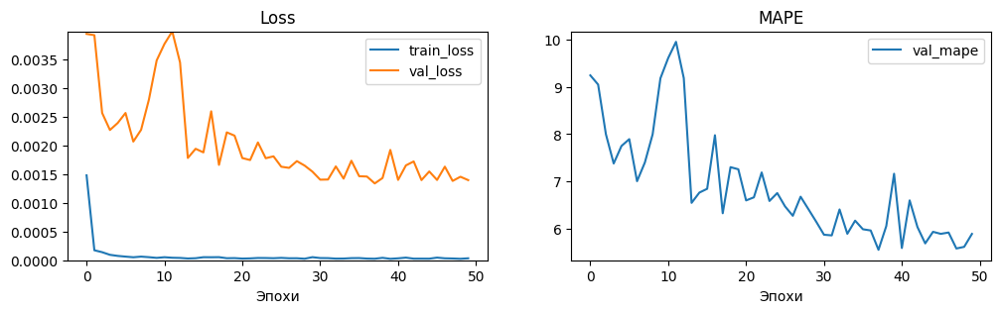

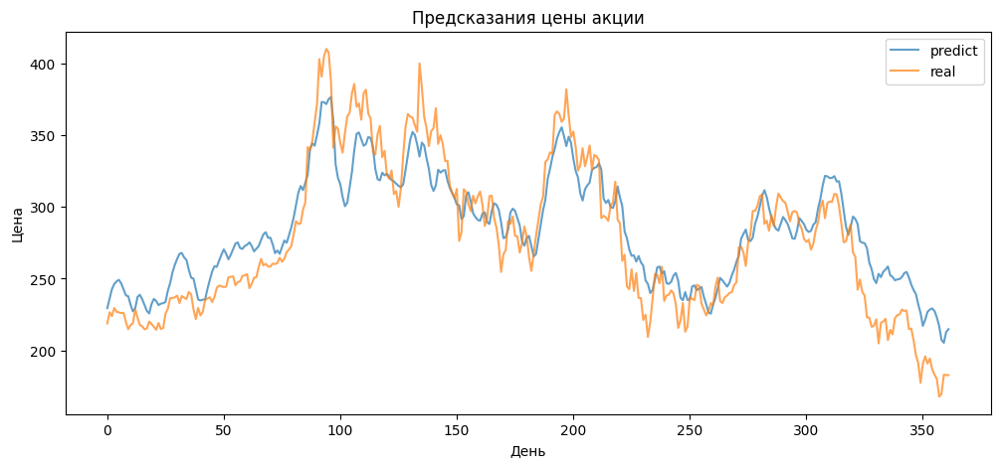

In [272]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

# y_test_real = np.exp(y_test_real)
# y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'simple LSTM')
print_metrics(metrics, metrics_names)

### Stacked LSTM

In [262]:
def stacked_lstm(history_points, n_features, future_points, n_lstm, n_dense, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        LSTM(n_lstm),
        Dropout(dropout),
        Dense(n_dense, activation='relu'),
        Dense(future_points, activation='linear'),
    ])
    return model

In [282]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 20
batch_size=32

model = stacked_lstm(history_points, n_features, future_points, 50, 25, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
#                     verbose=0,
                    )

Epoch 1/20
43/43 [==============================] - 5s 32ms/step - loss: 0.1198 - mape: 307460.1250 - val_loss: 0.0107 - val_mape: 13.4796
Epoch 2/20
43/43 [==============================] - 0s 9ms/step - loss: 0.0103 - mape: 394426.2188 - val_loss: 0.0106 - val_mape: 13.4768
Epoch 3/20
43/43 [==============================] - 0s 8ms/step - loss: 0.0097 - mape: 421321.0312 - val_loss: 0.0103 - val_mape: 13.8184
Epoch 4/20
43/43 [==============================] - 0s 10ms/step - loss: 0.0095 - mape: 355895.8438 - val_loss: 0.0103 - val_mape: 13.6142
Epoch 5/20
43/43 [==============================] - 0s 9ms/step - loss: 0.0095 - mape: 410032.7188 - val_loss: 0.0102 - val_mape: 13.7651
Epoch 6/20
43/43 [==============================] - 0s 8ms/step - loss: 0.0094 - mape: 394483.9062 - val_loss: 0.0103 - val_mape: 13.4039
Epoch 7/20
43/43 [==============================] - 0s 9ms/step - loss: 0.0096 - mape: 379109.1562 - val_loss: 0.0101 - val_mape: 13.8407
Epoch 8/20
43/43 [==============

MSE: 0.0014926213049239962
RMSE: 0.03863445748194216
MAE: 0.028928325139385074
MAPE: 2.363405685464282


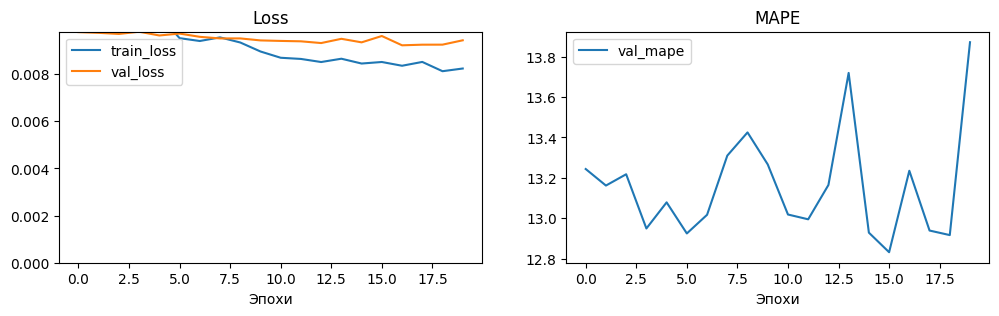

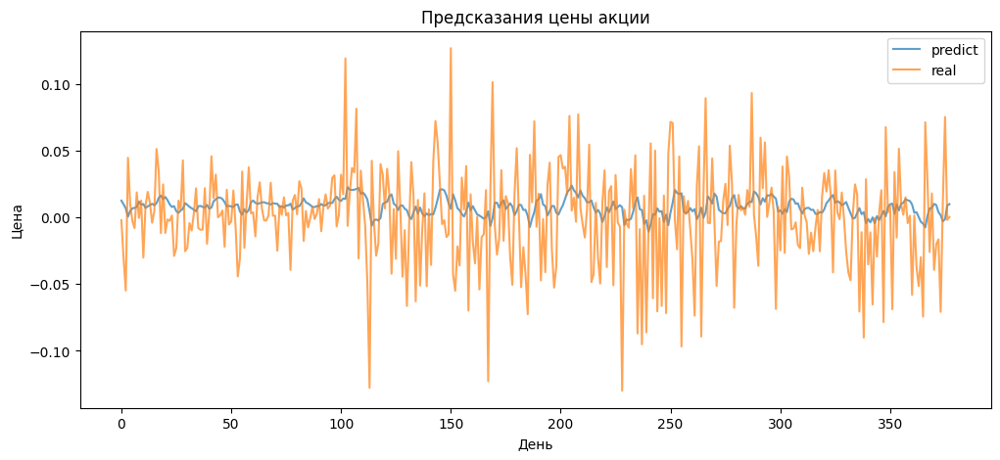

In [264]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

# y_test_real = np.exp(y_test_real)
# y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'stacked LSTM')
print_metrics(metrics, metrics_names)

### Stacked Double LSTM

In [273]:
def stacked_double_lstm(history_points, n_features, future_points, n_lstm_1, n_lstm_2, n_dense, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        LSTM(n_lstm_1, return_sequences=True),
        LSTM(n_lstm_2, return_sequences=False),
        Dense(n_dense, activation='linear'),
        Dropout(dropout),
        Dense(future_points, activation='linear'),
    ])
    return model

In [274]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 50
batch_size=32

model = stacked_double_lstm(history_points, n_features, future_points, 100, 100, 50, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
                    )

Epoch 1/50
43/43 [==============================] - 11s 99ms/step - loss: 0.0033 - mape: 29981.9668 - val_loss: 0.0083 - val_mape: 12.6734
Epoch 2/50
43/43 [==============================] - 3s 64ms/step - loss: 3.8059e-04 - mape: 20926.9805 - val_loss: 0.0118 - val_mape: 16.8911
Epoch 3/50
43/43 [==============================] - 3s 66ms/step - loss: 3.0394e-04 - mape: 2497.8320 - val_loss: 0.0052 - val_mape: 10.4422
Epoch 4/50
43/43 [==============================] - 3s 69ms/step - loss: 2.4414e-04 - mape: 12290.4629 - val_loss: 0.0049 - val_mape: 10.1970
Epoch 5/50
43/43 [==============================] - 3s 59ms/step - loss: 2.9456e-04 - mape: 5807.2778 - val_loss: 0.0045 - val_mape: 9.7399
Epoch 6/50
43/43 [==============================] - 3s 67ms/step - loss: 2.7004e-04 - mape: 4117.9214 - val_loss: 0.0037 - val_mape: 9.9391
Epoch 7/50
43/43 [==============================] - 3s 63ms/step - loss: 1.6847e-04 - mape: 2416.4993 - val_loss: 0.0046 - val_mape: 10.0211
Epoch 8/50
43/4

In [275]:
np.array(history.history['val_mape']).argmin() + 1

44

MSE: 1174.412090861492
RMSE: 34.269696392899256
MAE: 29.566260069114726
MAPE: 0.1175211447842676


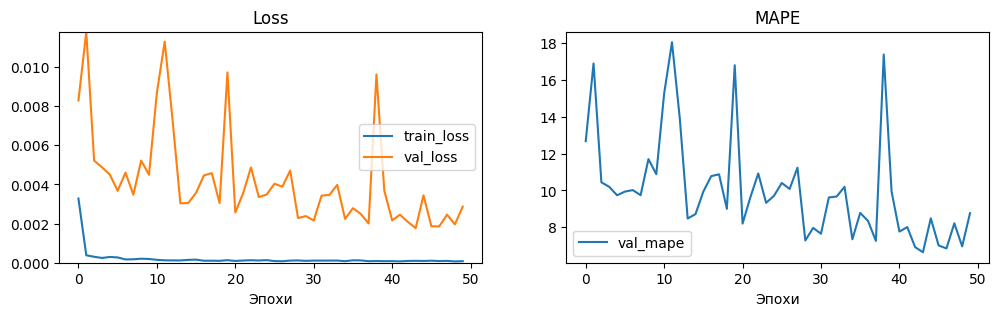

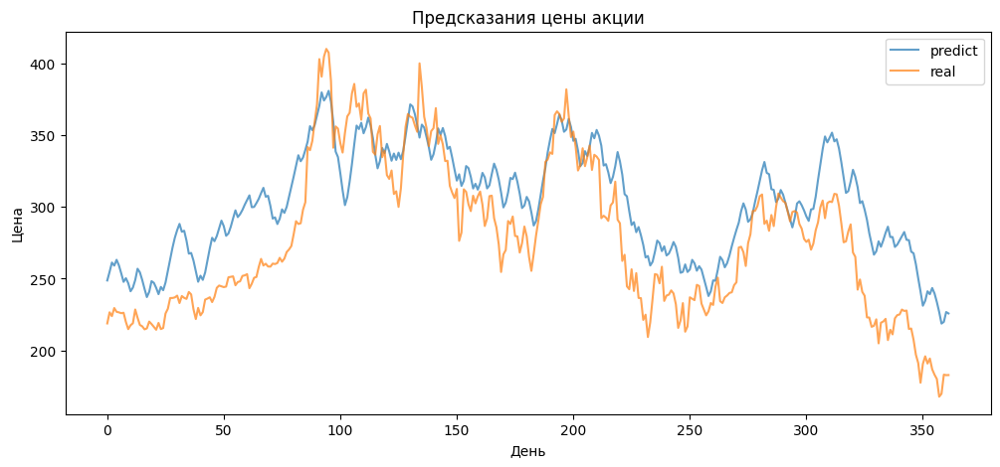

In [276]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

# y_test_real = np.exp(y_test_real)
# y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'stacked double LSTM')
print_metrics(metrics, metrics_names)

### Triple LSTM

In [50]:
def triple_lstm(history_points, n_features, future_points, n_lstm_1, n_lstm_2, n_lstm_3, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        LSTM(n_lstm_1, return_sequences=True),
        Dropout(dropout),
        LSTM(n_lstm_2, return_sequences=True),
        Dropout(dropout),
        LSTM(n_lstm_3, return_sequences=False),
        Dropout(dropout),
        Dense(future_points, activation='linear'),
    ])
    return model

In [56]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 43
batch_size=32

model = triple_lstm(history_points, n_features, future_points, 100, 100, 100, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
#                     verbose=0,
                    )

Epoch 1/43
43/43 [==============================] - 16s 152ms/step - loss: 7.6231e-04 - mape: 12133.4443 - val_loss: 0.0052 - val_mape: 11.5956
Epoch 2/43
43/43 [==============================] - 4s 93ms/step - loss: 2.4606e-04 - mape: 9699.6094 - val_loss: 0.0034 - val_mape: 9.0407
Epoch 3/43
43/43 [==============================] - 4s 92ms/step - loss: 1.9251e-04 - mape: 5240.9800 - val_loss: 0.0040 - val_mape: 10.4114
Epoch 4/43
43/43 [==============================] - 4s 98ms/step - loss: 1.9303e-04 - mape: 7991.6099 - val_loss: 0.0036 - val_mape: 8.7932
Epoch 5/43
43/43 [==============================] - 4s 95ms/step - loss: 2.1834e-04 - mape: 8074.1582 - val_loss: 0.0054 - val_mape: 11.0095
Epoch 6/43
43/43 [==============================] - 4s 92ms/step - loss: 3.2559e-04 - mape: 15798.4902 - val_loss: 0.0026 - val_mape: 8.0090
Epoch 7/43
43/43 [==============================] - 4s 94ms/step - loss: 1.9472e-04 - mape: 9551.0039 - val_loss: 0.0028 - val_mape: 7.9605
Epoch 8/43
43

In [55]:
np.array(history.history['val_mape']).argmin() + 1

43

MSE: 547.4022740594366
RMSE: 23.396629544860446
MAE: 17.563783255729884
MAPE: 0.058622702060789164


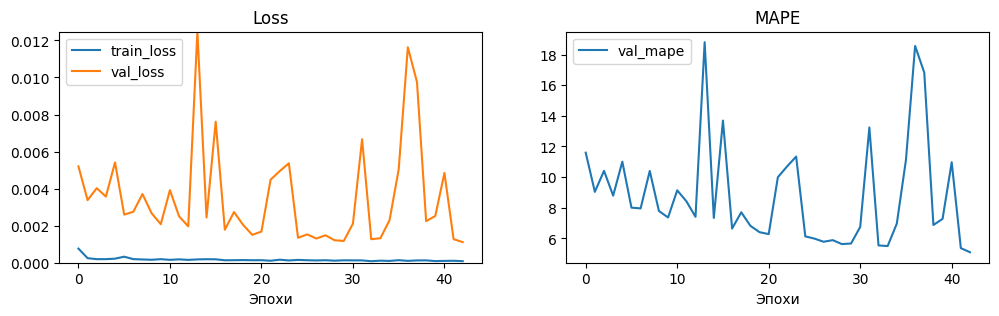

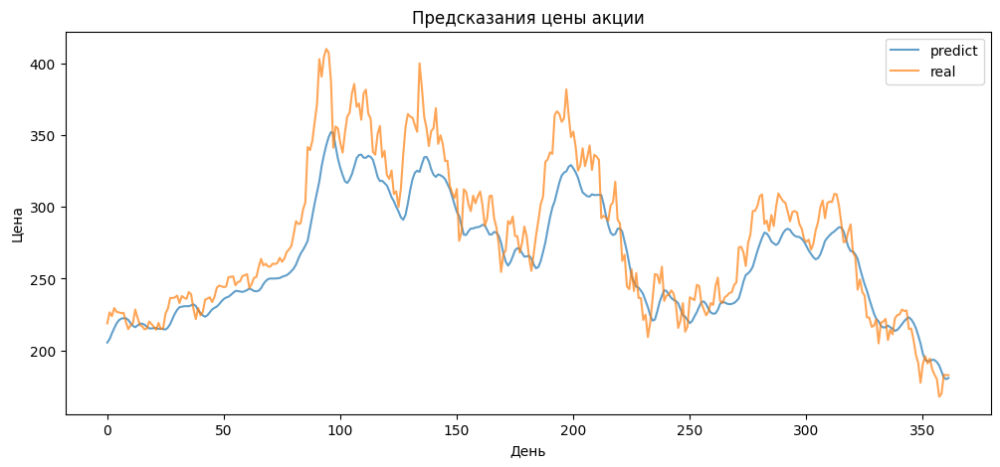

In [57]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

# y_test_real = np.exp(y_test_real)
# y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'triple LSTM')
print_metrics(metrics, metrics_names)

### GRU

In [152]:
def simple_gru(history_points, n_features, future_points, n_gru, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        GRU(n_gru, dropout=dropout),
        Dense(future_points),
    ])
    return model

In [327]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 50
batch_size=32

model = simple_gru(history_points, n_features, future_points, 100, .0)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
                    )

Epoch 1/50
43/43 [==============================] - 6s 47ms/step - loss: 0.0110 - mape: 78037.8906 - val_loss: 0.0024 - val_mape: 5.6465
Epoch 2/50
43/43 [==============================] - 1s 28ms/step - loss: 3.6356e-04 - mape: 21851.3965 - val_loss: 4.8007e-04 - val_mape: 2.2458
Epoch 3/50
43/43 [==============================] - 1s 29ms/step - loss: 2.2282e-04 - mape: 27560.8887 - val_loss: 7.9829e-04 - val_mape: 3.0211
Epoch 4/50
43/43 [==============================] - 1s 28ms/step - loss: 2.1346e-04 - mape: 28794.2266 - val_loss: 0.0011 - val_mape: 3.6026
Epoch 5/50
43/43 [==============================] - 1s 28ms/step - loss: 2.1264e-04 - mape: 26467.6387 - val_loss: 6.9872e-04 - val_mape: 2.8275
Epoch 6/50
43/43 [==============================] - 1s 29ms/step - loss: 2.1198e-04 - mape: 24137.3516 - val_loss: 6.7115e-04 - val_mape: 2.7740
Epoch 7/50
43/43 [==============================] - 1s 29ms/step - loss: 1.9301e-04 - mape: 23359.6836 - val_loss: 2.1512e-04 - val_mape: 1.32

In [328]:
np.array(history.history['val_mape']).argmin() + 1

48

MSE: 134.00601325339696
RMSE: 11.576096632863642
MAE: 8.484440376745408
MAPE: 0.03046359839519602


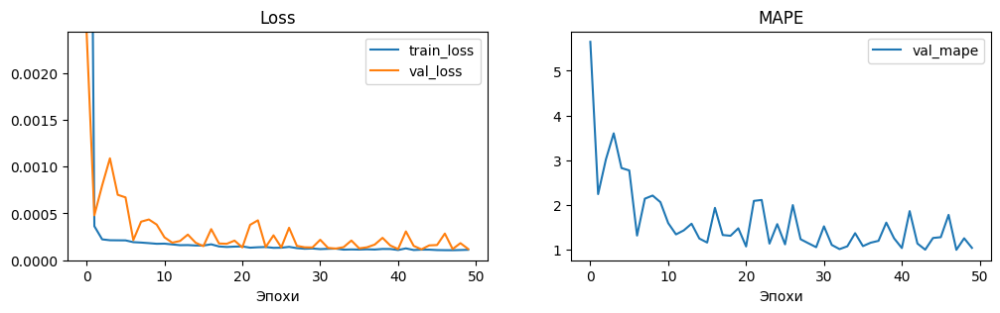

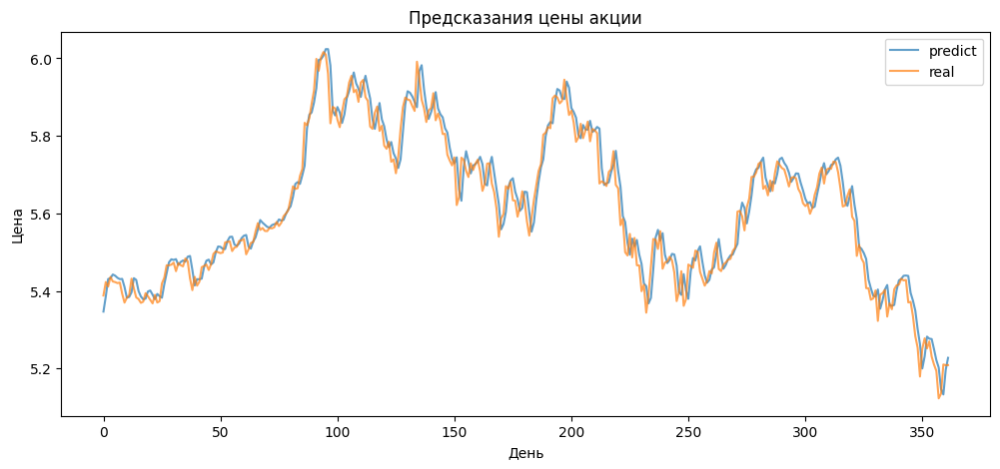

In [329]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

y_test_real = np.exp(y_test_real)
y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'simple GRU')
print_metrics(metrics, metrics_names)

### Stacked GRU

In [199]:
def stacked_gru(history_points, n_features, future_points, n_gru, n_dense, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        GRU(n_gru),
        Dropout(dropout),
        Dense(n_dense, activation='relu'),
        Dense(future_points, activation='linear'),
    ])
    return model

In [200]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 100
batch_size=32

model = stacked_gru(history_points, n_features, future_points, 100, 60, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
#                     verbose=0,
                    )

Epoch 1/100
43/43 [==============================] - 6s 51ms/step - loss: 9.2405e-04 - mape: 3514.9592 - val_loss: 0.0016 - val_mape: 5.9415
Epoch 2/100
43/43 [==============================] - 1s 30ms/step - loss: 1.0550e-04 - mape: 7225.3555 - val_loss: 0.0015 - val_mape: 5.6425
Epoch 3/100
43/43 [==============================] - 1s 29ms/step - loss: 8.8153e-05 - mape: 335.3827 - val_loss: 8.9297e-04 - val_mape: 4.4173
Epoch 4/100
43/43 [==============================] - 1s 35ms/step - loss: 8.4393e-05 - mape: 6018.5635 - val_loss: 7.8359e-04 - val_mape: 4.2548
Epoch 5/100
43/43 [==============================] - 1s 28ms/step - loss: 7.0776e-05 - mape: 3603.1189 - val_loss: 0.0012 - val_mape: 4.9788
Epoch 6/100
43/43 [==============================] - 1s 30ms/step - loss: 6.9269e-05 - mape: 4114.2012 - val_loss: 7.9867e-04 - val_mape: 4.1495
Epoch 7/100
43/43 [==============================] - 1s 30ms/step - loss: 6.6399e-05 - mape: 5431.8657 - val_loss: 7.9707e-04 - val_mape: 4.148

In [201]:
np.array(history.history['val_loss']).argmin() + 1

48

MSE: 244.06844282764376
RMSE: 15.62268999972936
MAE: 12.513514987671574
MAPE: 0.04355162837122077


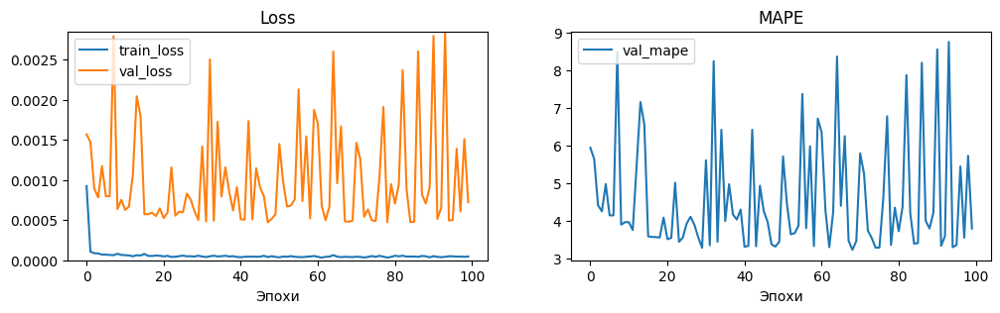

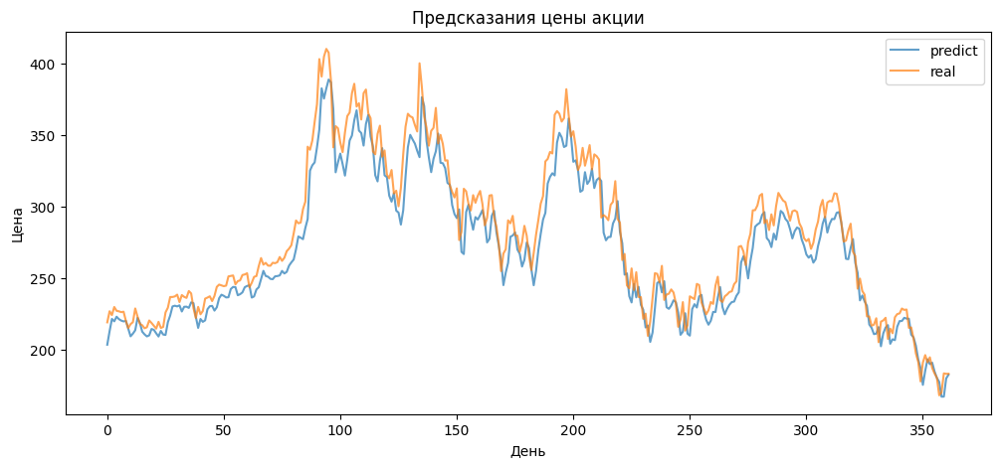

In [202]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

# y_test_real = np.exp(y_test_real)
# y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'stacked GRU')
print_metrics(metrics, metrics_names)

### Stacked double GRU

In [265]:
def stacked_double_gru(history_points, n_features, future_points, n_gru_1, n_gru_2, n_dense, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        GRU(n_gru_1, return_sequences=True),
        Dropout(dropout),
        GRU(n_gru_2, return_sequences=False),
        Dropout(dropout),
        Dense(n_dense, activation='relu'),
        Dense(future_points, activation='linear'),
    ])
    return model

In [370]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 100
batch_size=32

model = stacked_double_gru(history_points, n_features, future_points, 100, 100, history_points, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
#                     verbose=0,
                    )

Epoch 1/50
31/31 [==============================] - 16s 259ms/step - loss: 0.0044 - mape: 11051.3682 - val_loss: 0.0026 - val_mape: 6.7841
Epoch 2/50
31/31 [==============================] - 7s 229ms/step - loss: 6.1765e-04 - mape: 25162.8320 - val_loss: 6.2060e-04 - val_mape: 3.0676
Epoch 3/50
31/31 [==============================] - 7s 231ms/step - loss: 4.9138e-04 - mape: 20709.6641 - val_loss: 0.0019 - val_mape: 5.8008
Epoch 4/50
31/31 [==============================] - 7s 214ms/step - loss: 5.2148e-04 - mape: 4595.2310 - val_loss: 0.0014 - val_mape: 4.8389
Epoch 5/50
31/31 [==============================] - 7s 229ms/step - loss: 4.5305e-04 - mape: 33469.0977 - val_loss: 0.0012 - val_mape: 4.3863
Epoch 6/50
31/31 [==============================] - 7s 217ms/step - loss: 4.9167e-04 - mape: 22971.3652 - val_loss: 0.0013 - val_mape: 4.5905
Epoch 7/50
31/31 [==============================] - 7s 233ms/step - loss: 3.9991e-04 - mape: 12695.7295 - val_loss: 0.0022 - val_mape: 6.4748
Epoch 

MSE: 255.9626354165297
RMSE: 15.998832314157484
MAE: 12.894005812382105
MAPE: 0.04855267378943367


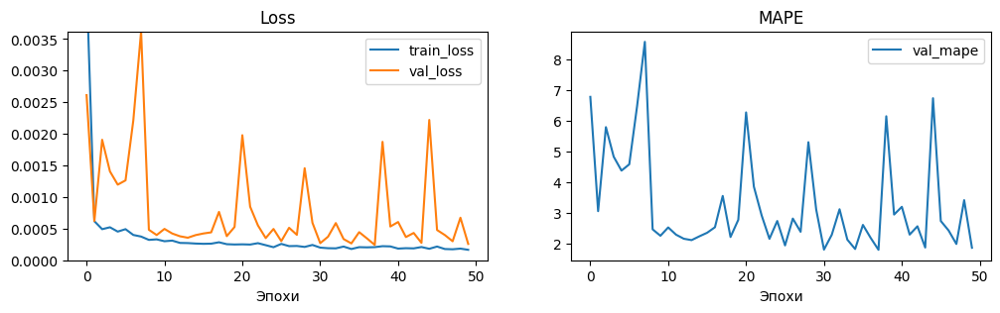

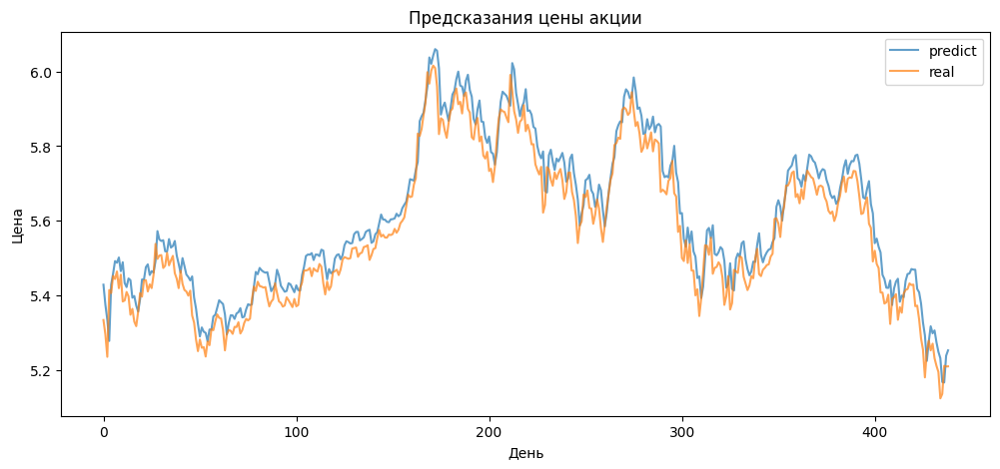

In [371]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

y_test_real = np.exp(y_test_real)
y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'stacked double GRU')
print_metrics(metrics, metrics_names)

### Triple GRU

In [335]:
def triple_gru(history_points, n_features, future_points, n_gru_1, n_gru_2, n_gru_3, dropout):
    model = Sequential([
        Input((history_points, n_features)),
        GRU(n_gru_1, return_sequences=True),
        Dropout(dropout),
        GRU(n_gru_2, return_sequences=True),
        Dropout(dropout),
        GRU(n_gru_3, return_sequences=False),
        Dropout(dropout),
        Dense(future_points, activation='linear'),
    ])
    return model

In [340]:
%%time
set_random_seed(RANDOM_SEED)

learning_rate = 0.0008
epochs = 29
batch_size=32

model = triple_gru(history_points, n_features, future_points, 100, 100, 50, .2)
optimazer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimazer, loss='mse', metrics=['mape'])

history = model.fit(X_train,
                    y_train,
                    batch_size=batch_size,
                    epochs=epochs,
                    validation_split=0.1,
                    shuffle=True,
                    )

Epoch 1/29
43/43 [==============================] - 15s 127ms/step - loss: 0.0075 - mape: 65382.7344 - val_loss: 0.0043 - val_mape: 7.6280
Epoch 2/29
43/43 [==============================] - 3s 77ms/step - loss: 9.6390e-04 - mape: 34907.2930 - val_loss: 4.2723e-04 - val_mape: 1.9224
Epoch 3/29
43/43 [==============================] - 3s 76ms/step - loss: 0.0011 - mape: 29702.1738 - val_loss: 4.8874e-04 - val_mape: 2.2450
Epoch 4/29
43/43 [==============================] - 4s 83ms/step - loss: 9.0017e-04 - mape: 28884.5859 - val_loss: 3.2299e-04 - val_mape: 1.6943
Epoch 5/29
43/43 [==============================] - 4s 82ms/step - loss: 8.4921e-04 - mape: 26324.3750 - val_loss: 2.9829e-04 - val_mape: 1.6211
Epoch 6/29
43/43 [==============================] - 4s 89ms/step - loss: 8.5579e-04 - mape: 36316.3164 - val_loss: 7.5277e-04 - val_mape: 2.8987
Epoch 7/29
43/43 [==============================] - 3s 77ms/step - loss: 7.8040e-04 - mape: 23778.5391 - val_loss: 5.6123e-04 - val_mape: 2.

In [341]:
np.array(history.history['val_loss']).argmin() + 1

29

MSE: 187.2422054337262
RMSE: 13.683647373186954
MAE: 10.39743261179213
MAPE: 0.03686138843814968


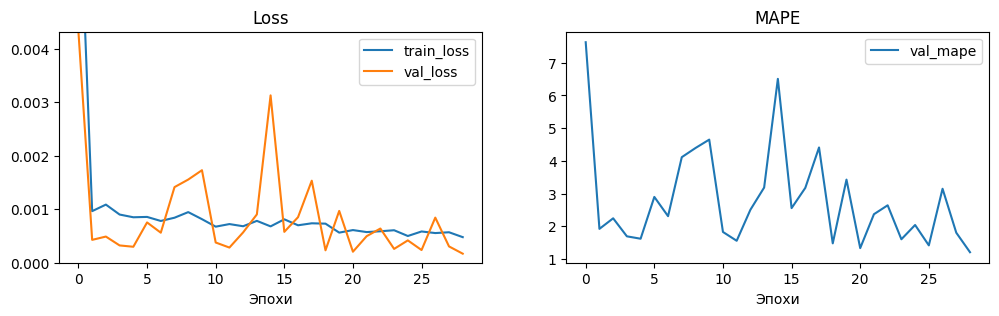

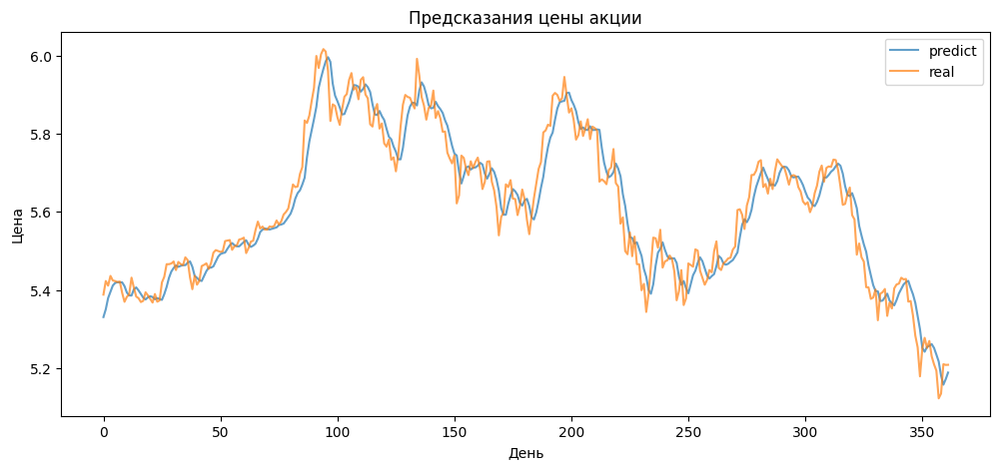

In [342]:
y_test_predict, y_test_real = inverse_predict_real(model, X_test, y_test, y_scaler)
y_train_predict, y_train_real = inverse_predict_real(model, X_train, y_train, y_scaler)

plot_result_model(history)
plot_predicted_points(y_test_predict, y_test_real)

y_test_real = np.exp(y_test_real)
y_test_predict = np.exp(y_test_predict)

metrics = calculate_metrics(y_test_real, y_test_predict)
df_results = add_results(df_results, metrics, 'triple GRU')
print_metrics(metrics, metrics_names)

In [343]:
df_results.sort_values(metrics_names)

,model,MSE,RMSE,MAE,MAPE
4,baseline,0.001416,0.037632,0.027760,0.004949
5,EMA,0.001527,0.039080,0.029477,0.005254
6,simple GRU,134.006013,11.576097,8.484440,0.030464
7,triple GRU,187.242205,13.683647,10.397433,0.036861
1,stacked GRU,244.068443,15.622690,12.513515,0.043552
2,simple LSTM,482.232051,21.959783,18.190241,0.069505
0,triple LSTM,547.402274,23.396630,17.563783,0.058623
3,stacked double LSTM,1174.412091,34.269696,29.566260,0.117521


## Один тестовый пример

In [148]:
def plot_1_example(inputs, predict, real, baseline=None):
    ni = len(inputs)
    no = len(predict)
    x = np.arange(ni, ni + no)
    
    plt.figure(figsize=(12, 4))
    plt.plot(inputs, '-o')
    plt.plot(x, predict, '-P', label='predict')
    plt.plot(x, real, '-o', label='real')
    if baseline is not None:   
        plt.plot(x, baseline, '-*', label='baseline')
    plt.legend()    

In [294]:
inputs.shape

(21, 13)

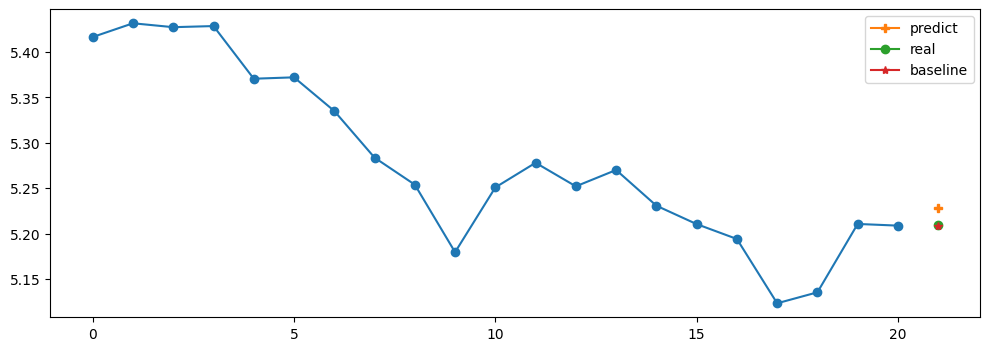

In [330]:
index = -1
inputs = X_test[index]
y_real = y_test[index]
baseline = y_predict_baseline[index].repeat(len(y_real))

y_predict = model.predict(np.expand_dims(inputs, 0), verbose=0)
y_predict = y_scaler.inverse_transform(y_predict).reshape(-1, 1)
inputs = x_scaler.inverse_transform(inputs)[:, -1]
y_real = y_scaler.inverse_transform(np.expand_dims(y_real, 0)).reshape(-1, 1)

plot_1_example(inputs, y_predict, y_real, baseline)

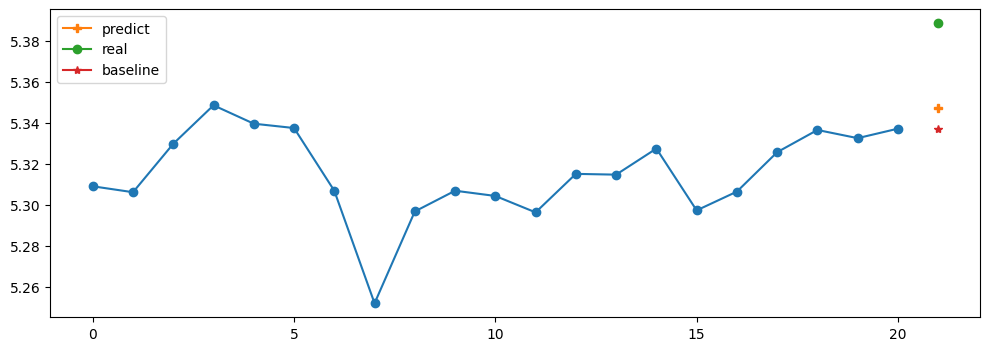

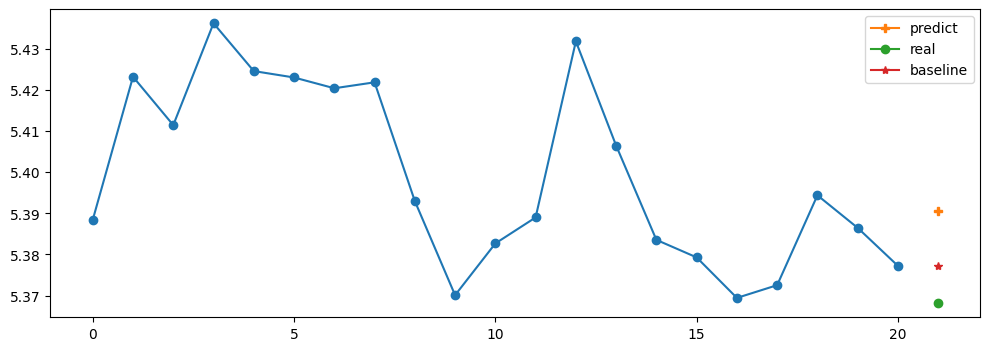

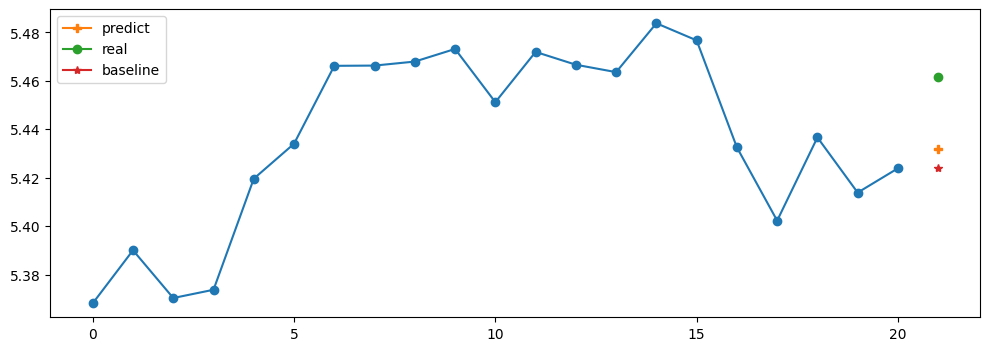

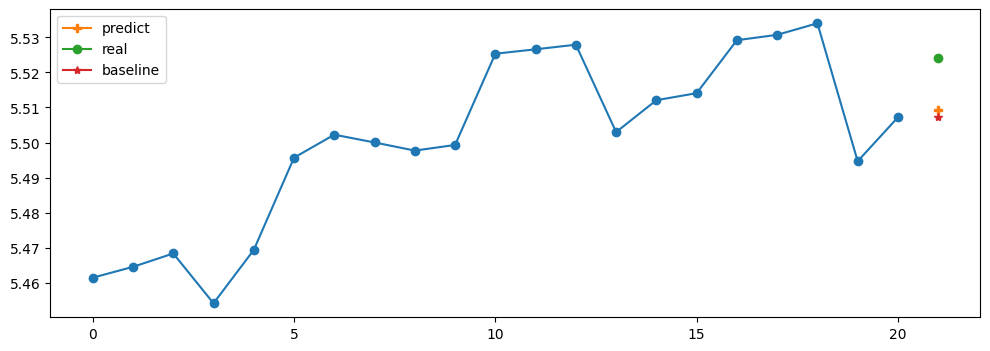

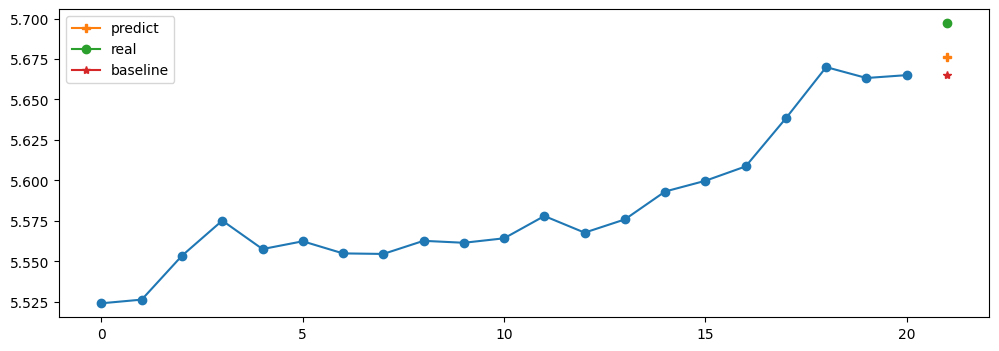

...

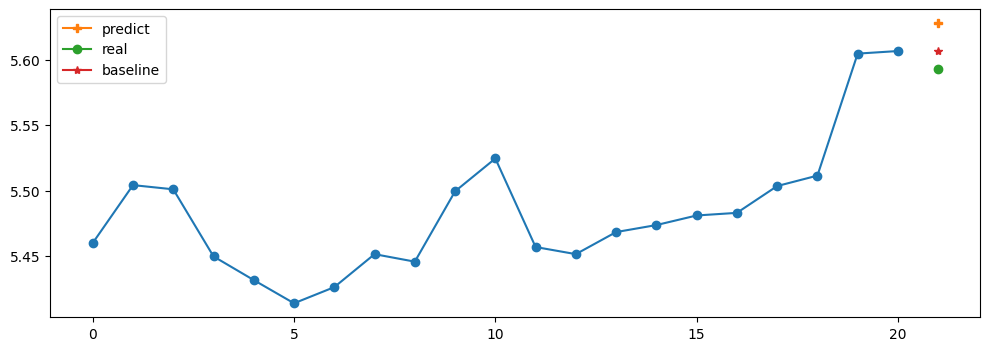

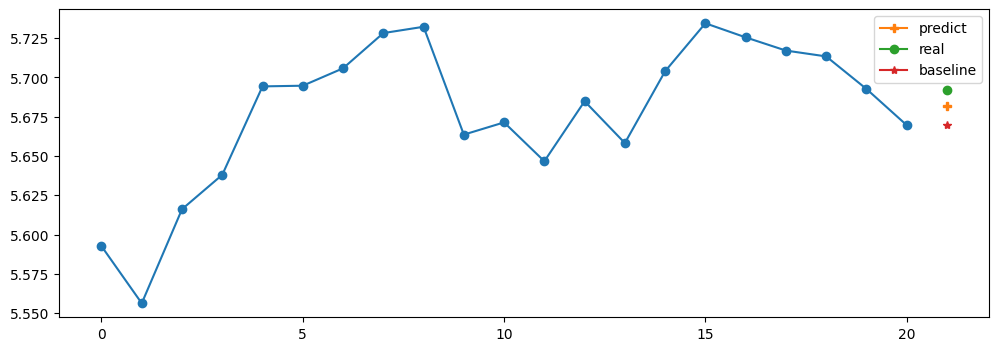

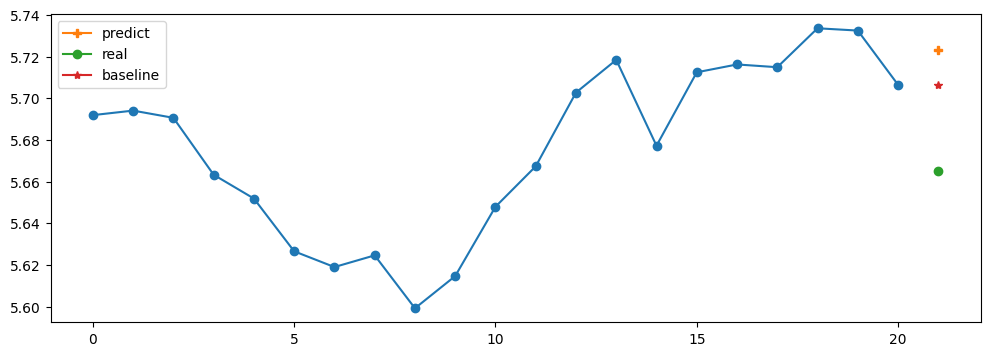

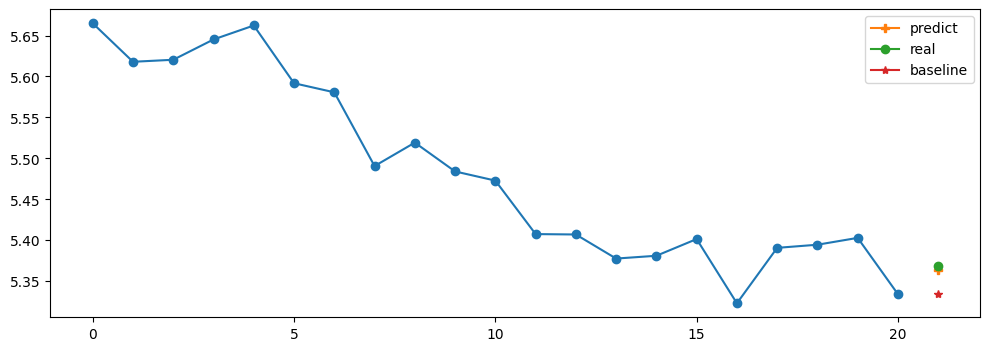

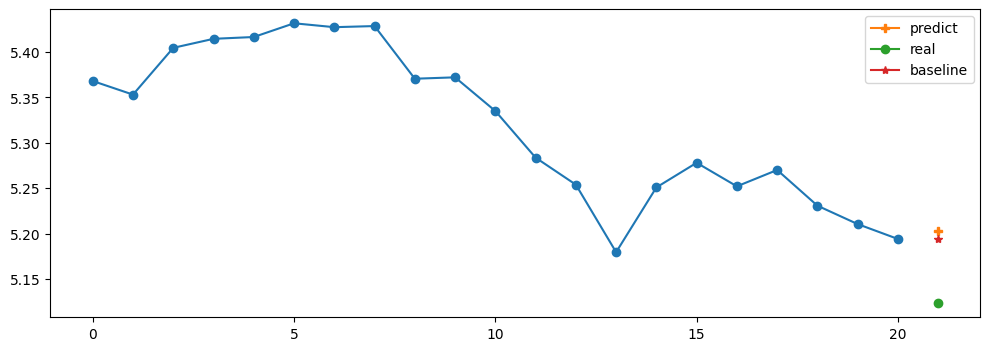

In [331]:
indexs = [i for i in range(0, len(y_test), history_points)]
for i in indexs:
    inputs = X_test[i]
    y_real = y_test[i]
    baseline = y_predict_baseline[i].repeat(len(y_real))

    y_predict = model.predict(np.expand_dims(inputs, 0), verbose=0)
    y_predict = y_scaler.inverse_transform(y_predict).reshape(-1, 1)
    inputs = x_scaler.inverse_transform(inputs)[:, -1]
    y_real = y_scaler.inverse_transform(np.expand_dims(y_real, 0)).reshape(-1, 1)

    plot_1_example(inputs, y_predict, y_real, baseline)

## Прогноз на N дней. Рекурсия

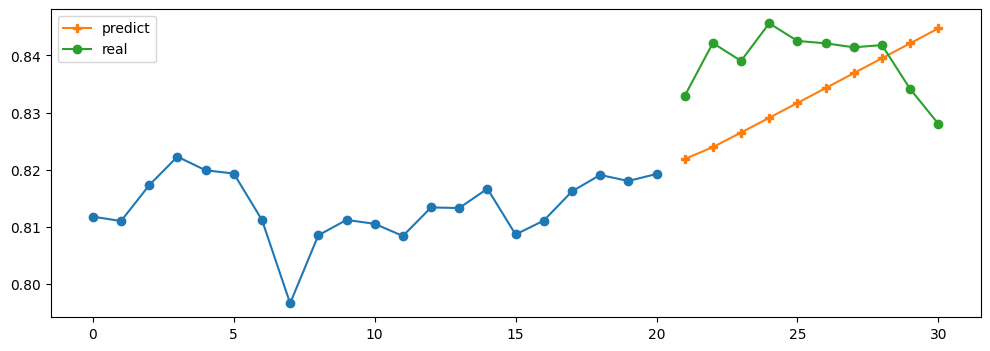

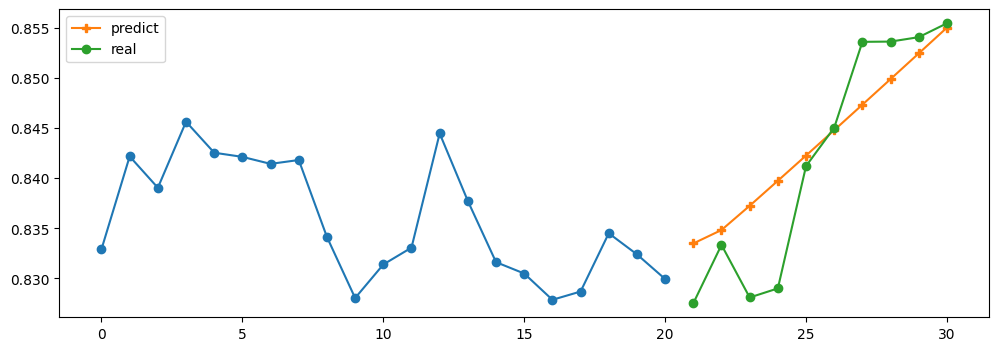

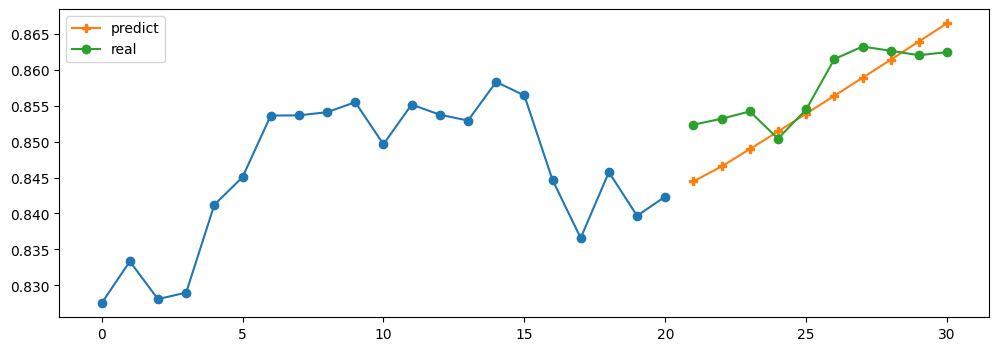

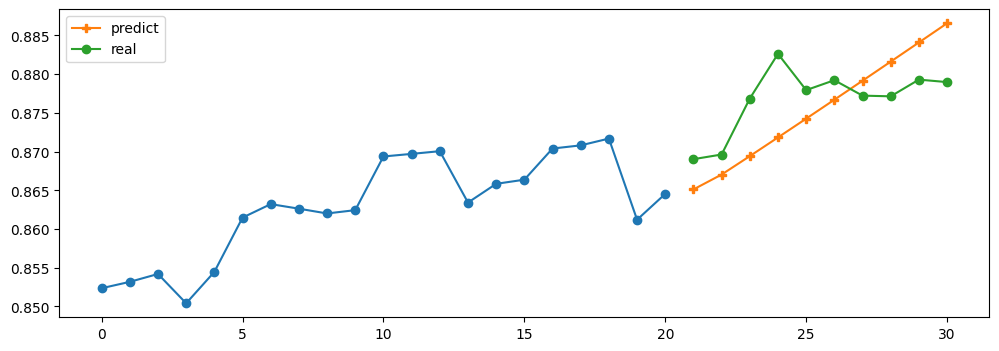

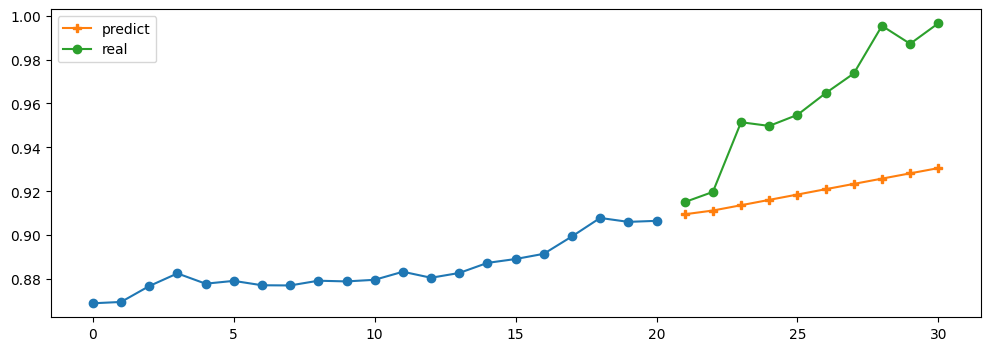

...

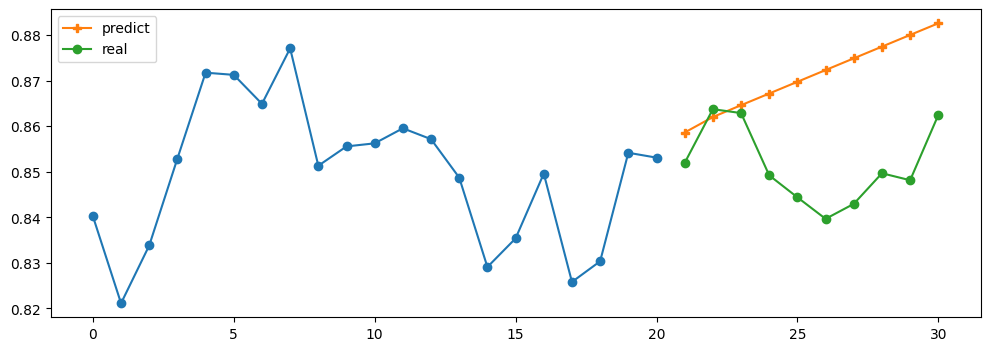

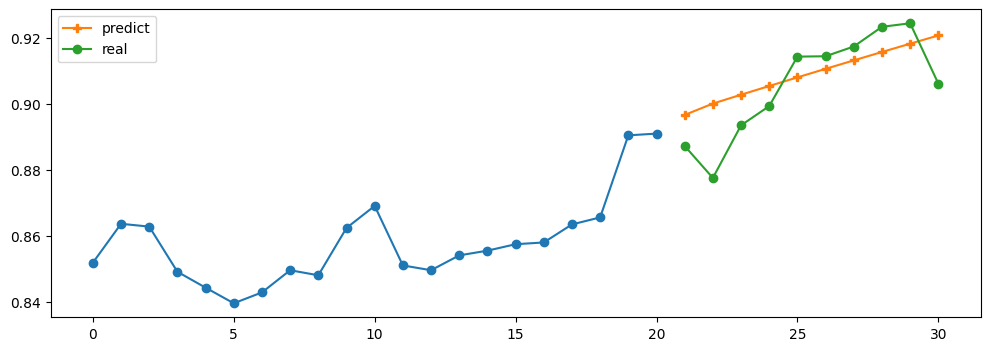

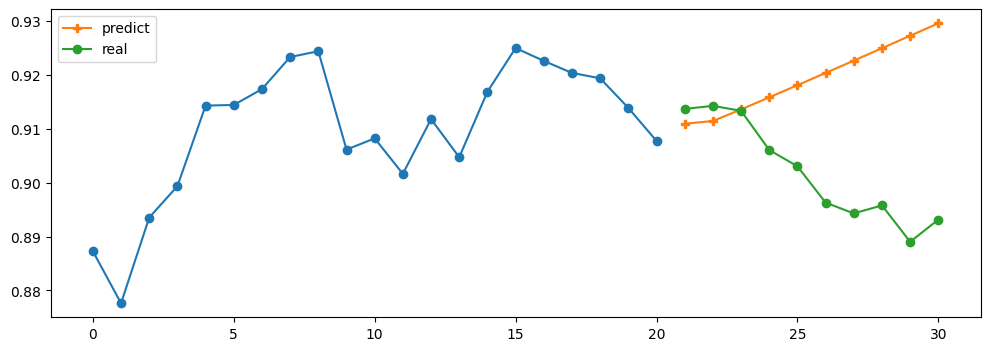

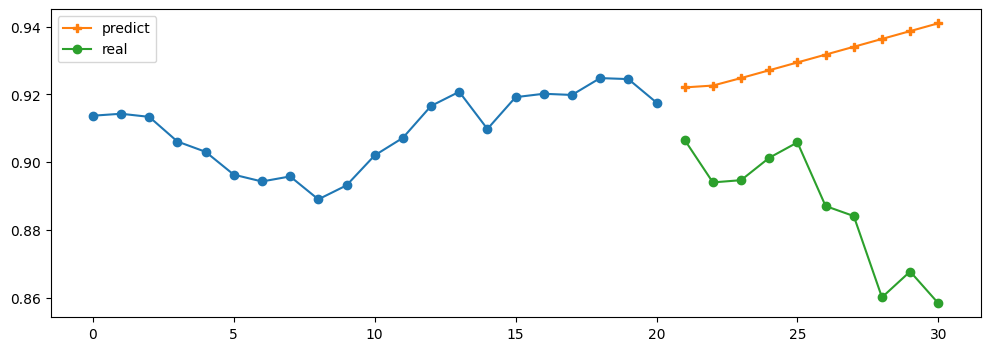

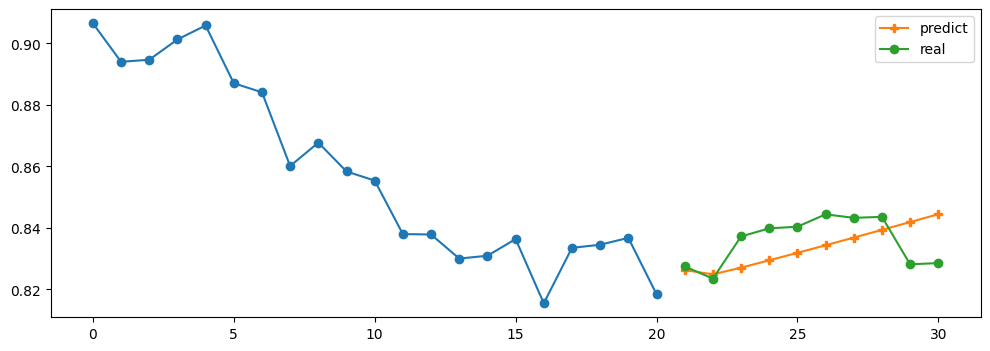

In [332]:
fp = 10
indexs = [i for i in range(0, len(y_test)-fp, history_points)]
for ind in indexs:
    x = X_test[ind]
    inputs = x.copy()
    y_real = y_test[ind: ind+fp]
    y_predicts = []
    for i in range(fp):
        y_predict = model.predict(np.expand_dims(inputs, 0), verbose=0).item()
        y_predicts.append(y_predict)
        inputs = np.vstack((inputs, y_predict))[-history_points:]

    plot_1_example(x, y_predicts, y_real)

## Прогноз на N дней. MIMO

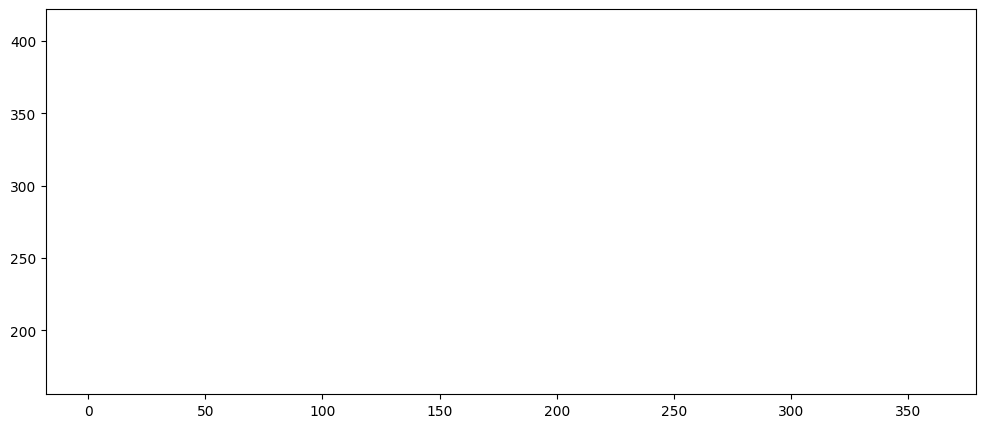

In [333]:
plt.figure(figsize=(12, 5))
for i, line in enumerate(y_test_predict):
    if i % 30 == 0:
        plt.plot(np.arange(i, i + future_points), line, c='red')
    
for i, line in enumerate(y_test_real):
    plt.plot(np.arange(i, i+ future_points), line, c='green')    
 

In [136]:
def print_metrics_ndays(y_real, y_predict):
    n = y_predict.shape[1]
    for i in range(n):
        real, predict = y_real[:, i], y_predict[:, i]
        mse = mean_squared_error(real, predict)
        rmse = mean_squared_error(real, predict, squared=False)
        mae = mean_absolute_error(real, predict)
        mape = mean_absolute_percentage_error(real, predict)
        print(f'День {i+1}')
        print('MSE:', mse)
        print('RMSE:', rmse)
        print('MAE:', mae)
        print('MAPE:', mape)
        print()
#     return mse, rmse, mae, mape

In [297]:
print_metrics_ndays(y_test_real, y_test_predict)

День 1
MSE: 645.6607690579433
RMSE: 25.40985574650008
MAE: 21.95337779295511
MAPE: 0.08525911081494959

День 2
MSE: 648.4052312912773
RMSE: 25.46380237300151
MAE: 21.219998151896387
MAPE: 0.08122031519185319

День 3
MSE: 1212.1406275142892
RMSE: 34.81581002237761
MAE: 29.92405389540688
MAPE: 0.11602697418692794

День 4
MSE: 2083.7644791401854
RMSE: 45.64826918011443
MAE: 39.82446459551763
MAPE: 0.15626282583292198

День 5
MSE: 2913.069731676978
RMSE: 53.97286106625234
MAE: 48.18329475445454
MAPE: 0.18768612693460696



Новости:
+ https://towardsdatascience.com/making-a-continual-ml-pipeline-to-predict-apple-stock-with-global-news-python-90e5d6610b21
+ https://medium.com/swlh/build-a-ml-web-app-for-stock-market-prediction-from-daily-news-with-streamlit-and-python-7c4cf918d9b4

Два входа в НС:
+ https://russianblogs.com/article/9801957431/

Доверительный интервал:
+ https://regenerativetoday.com/a-complete-guide-to-confidence-interval-and-calculation-in-python/

Броуновское движение:
+ https://www.kaggle.com/code/yclaudel/could-we-ve-predicted-the-spike-of-tesla-s-stock/notebook
+ https://towardsdatascience.com/simulating-stock-prices-in-python-using-geometric-brownian-motion-8dfd6e8c6b18